# MWTA with Noise

## Intro
* **Date**: 1/2/2021
* **What**: I'm basically doing the mwta, but with noisy data.
* **Why**: I think MWTA should be pretty resilient against noise and provide some pretty awesome de-noised reconstructions, but we'll see.
* **Hopes**: The reconstructions are pretty well de-noised after training mwta on noisy mnist.
* **Limitations**: There's really nothing stopping the neurons from also learning the noise, the the ephemeral nature of the noise should hopefully not register all that much.

## Code

In [39]:
import numpy as np
import cupy as cp
import matplotlib.pyplot as plt

from tensorflow.keras.datasets import mnist
from tqdm import tqdm
from numba import njit
from time import time

(train_x, train_y), (test_x, test_y) = mnist.load_data()

m_flat_tr = train_x.reshape(train_x.shape[0], -1) / 255.0
m_flat_te = test_x.reshape(test_x.shape[0], -1) / 255.0 

m_tr_len, m_len = m_flat_tr.shape

def draw_weights(w, Kx, Ky, s_len, fig):
    tapestry = np.zeros((s_len * Ky, s_len * Kx))
    
    w_i = 0
    for y in range(Ky):
        for x in range(Kx):
            tapestry[y * s_len: (y + 1) * s_len, x * s_len: (x + 1) * s_len] = w[w_i].reshape(s_len, s_len)
            w_i += 1
            
    plt.clf()        
    max_val = np.max(tapestry)
    im = plt.imshow(tapestry, cmap="Greys", vmax=max_val, vmin=0)
    fig.colorbar(im, ticks=[0, max_val])
    plt.axis("off")
    fig.canvas.draw()

In [2]:
m_noise = np.clip(m_flat_tr + np.random.normal(0, 0.2, m_flat_tr.shape), 0, 1)
gp_noise = cp.asarray(m_noise)

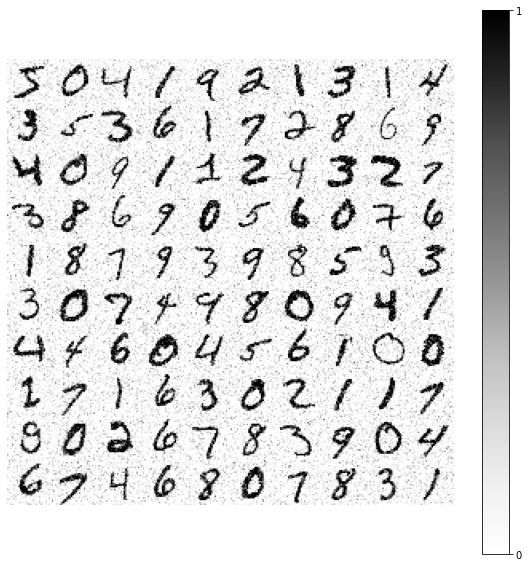

In [3]:
fig = plt.figure(figsize=(10, 10))

draw_weights(m_noise, 10, 10, 28, fig)

In [85]:
def reconstruct(img_i, w, Kx, Ky, gp, vmax, vmin):
    s_len = 28

    img = gp[img_i]

    v = img.reshape(-1, 1)
    p = w @ v
    winners = cp.argsort(p, axis=0)[-n_w:]
    mask = cp.zeros((N, 1))
    mask[winners] = 1
    o = mask * p
    r = w.T @ o

    plt.figure(figsize=(8, 4))

    plt.subplot(1, 3, 1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(img.reshape(s_len, s_len).get(), cmap="Greys", vmax=vmax, vmin=vmin)

    plt.subplot(1, 3, 2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(o.reshape(Ky, Kx).get(), cmap="Greys")

    plt.subplot(1, 3, 3)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(r.reshape(s_len, s_len).get(), cmap="Greys", vmax=vmax, vmin=vmin)

    plt.show()

<IPython.core.display.Javascript object>


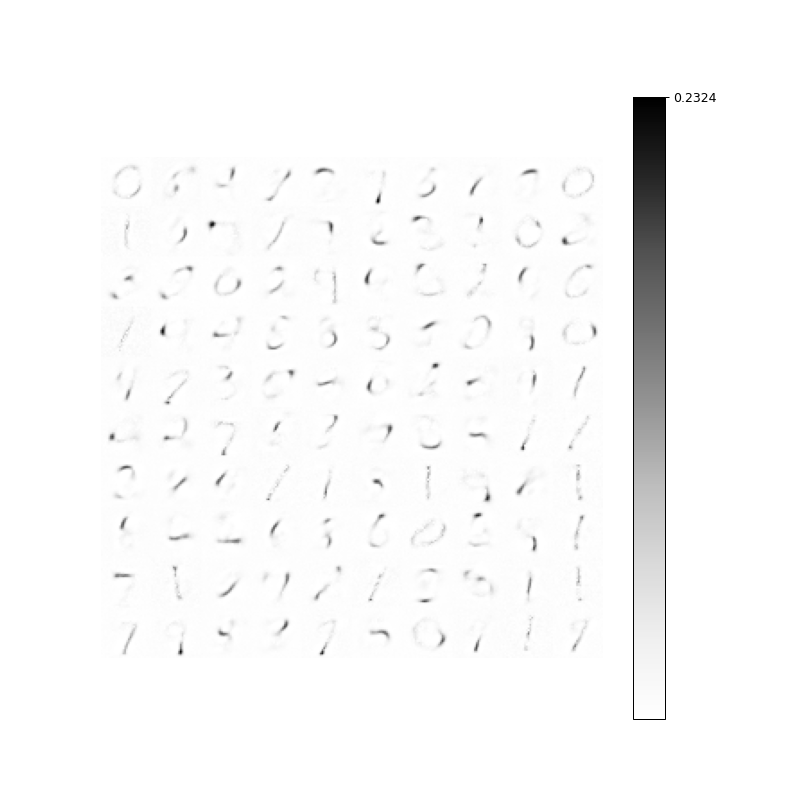

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6000/6000 [00:03<00:00, 1875.32it/s]


In [12]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 10
T_s = 6000

Kx = 10
Ky = 10
m_len = 28 * 28 
tr_len = 60000

prec = 1e-10

n_w = 10 #Number of winners

N = Kx * Ky

# Feedforward
w = cp.random.uniform(0, 1, (N, m_len))
xi = 0.002

for ep in range(Nep):
    inputs = gp_noise[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        p = w @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((N, 1))
        mask[winners] = 1
        o = mask * p
        r = w.T @ o
        mod_r = cp.maximum(r, prec)
        e = v - r

        w += w * o * (e / mod_r).T * xi

    draw_weights(w.get(), Kx, Ky, 28, fig)

<IPython.core.display.Javascript object>


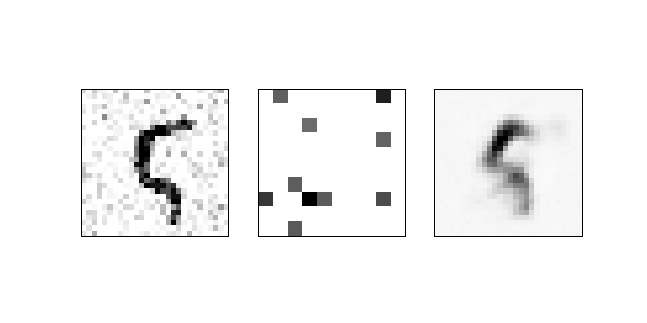

<IPython.core.display.Javascript object>


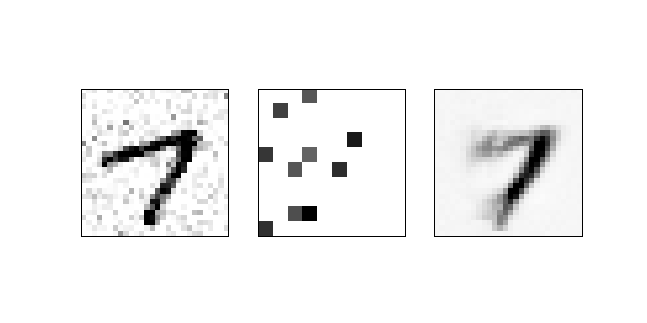

<IPython.core.display.Javascript object>


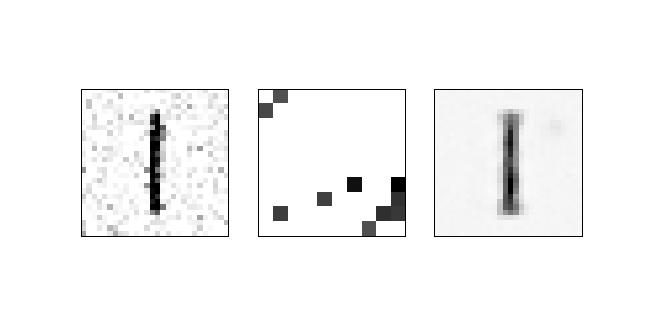

<IPython.core.display.Javascript object>


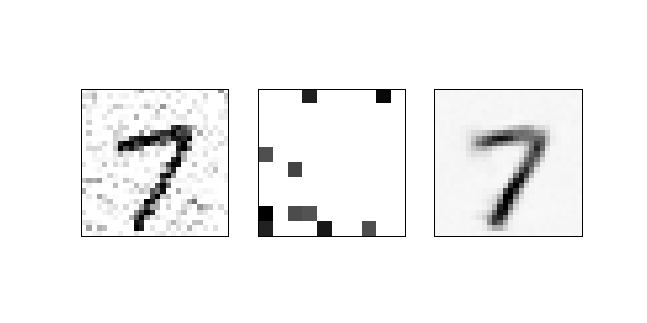

<IPython.core.display.Javascript object>


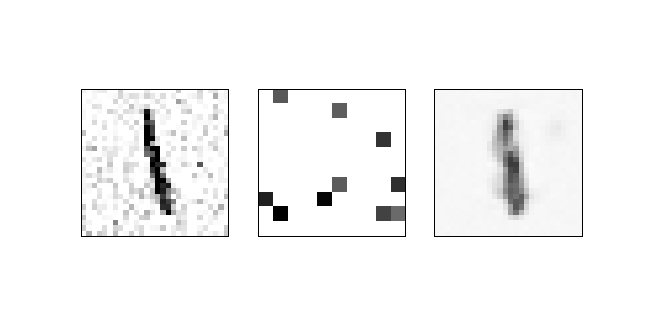

<IPython.core.display.Javascript object>


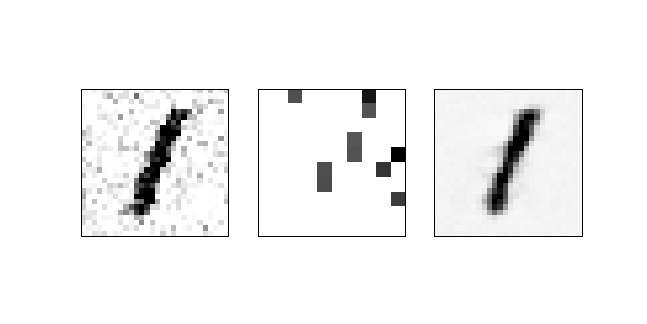

<IPython.core.display.Javascript object>


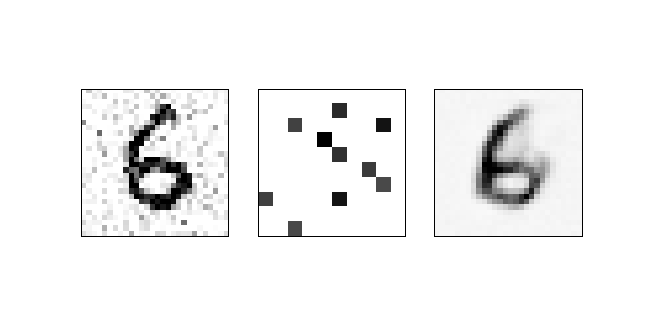

<IPython.core.display.Javascript object>


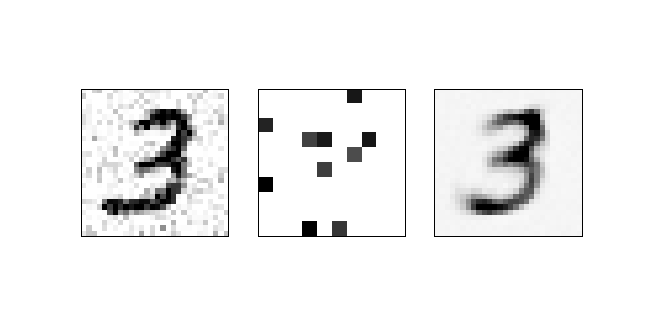

<IPython.core.display.Javascript object>


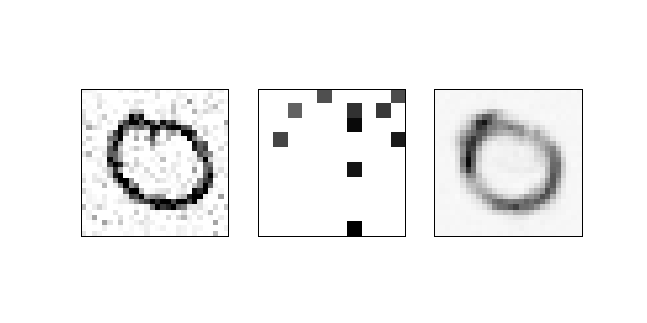

<IPython.core.display.Javascript object>


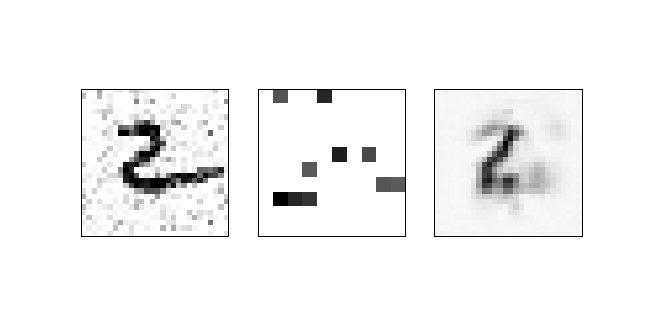

In [19]:
offset = 100

for i in range(10):
    reconstruct(i + offset, w, Kx, Ky)

## Analysis Dialog

Oh man!!!!! That's incredibly dope!!!  Ok, wait, I'm going to see what the minimum value is for the reconstructions.

<IPython.core.display.Javascript object>


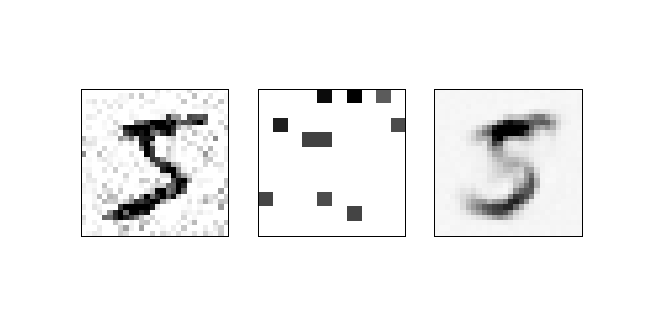

In [20]:
img_i = 0

s_len = 28

img = gp_noise[img_i]

v = img.reshape(-1, 1)
p = w @ v
winners = cp.argsort(p, axis=0)[-n_w:]
mask = cp.zeros((N, 1))
mask[winners] = 1
o = mask * p
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len).get(), cmap="Greys", vmax=1, vmin=0)

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(Ky, Kx).get(), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len).get(), cmap="Greys", vmax=1, vmin=0)

plt.show()

In [22]:
np.min(r)

array(0.04823852)

Ok!  So it looks like the base reconstruction noise-induced error is about 0.04.  That's pretty awesome!  And, I mean, the reconstructions aren't that bad at all.  And that's with 100 neurons!  I'm going to train this with 400, then 900, and see how it does.

<IPython.core.display.Javascript object>


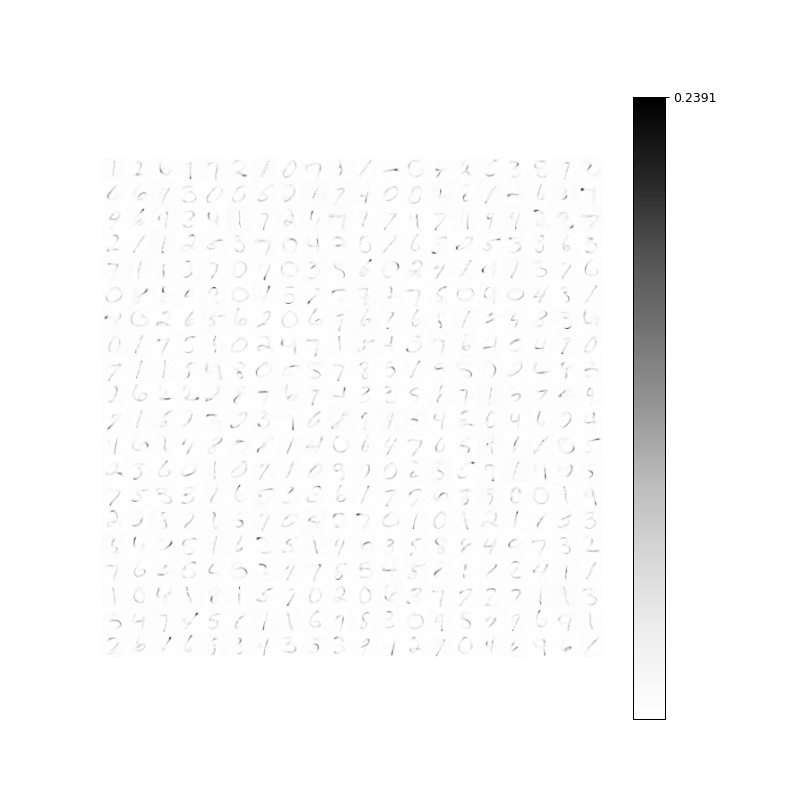

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6000/6000 [00:04<00:00, 1322.49it/s]


In [23]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 10
T_s = 6000

Kx = 20
Ky = 20
m_len = 28 * 28 
tr_len = 60000

prec = 1e-10

n_w = 10 #Number of winners

N = Kx * Ky

# Feedforward
w = cp.random.uniform(0, 1, (N, m_len))
xi = 0.005

for ep in range(Nep):
    inputs = gp_noise[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        p = w @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((N, 1))
        mask[winners] = 1
        o = mask * p
        r = w.T @ o
        mod_r = cp.maximum(r, prec)
        e = v - r

        w += w * o * (e / mod_r).T * xi

    draw_weights(w.get(), Kx, Ky, 28, fig)

<IPython.core.display.Javascript object>


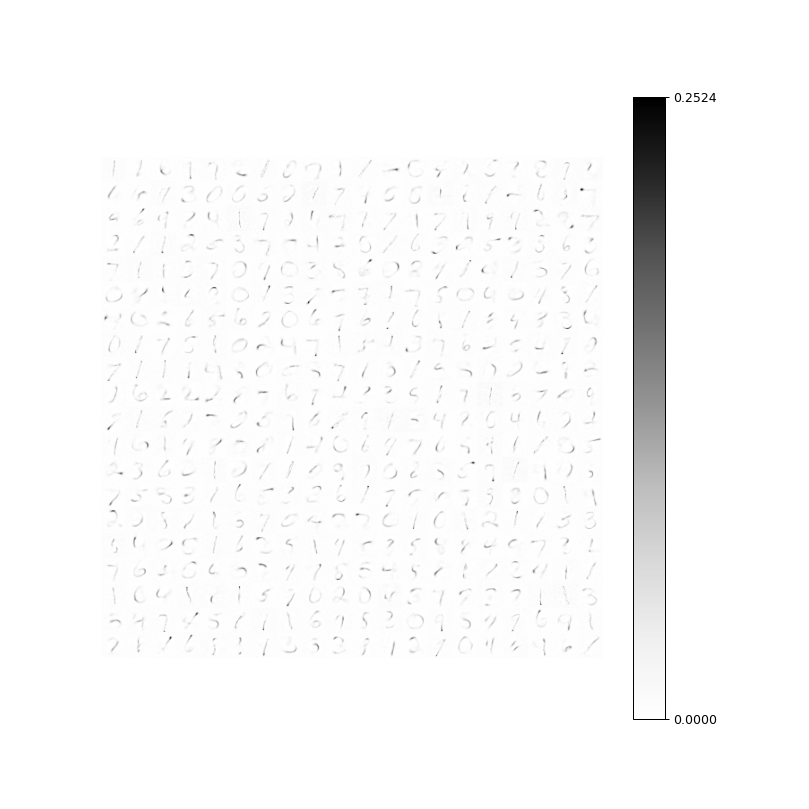

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6000/6000 [00:07<00:00, 826.95it/s]


In [24]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

for ep in range(Nep):
    inputs = gp_noise[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        p = w @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((N, 1))
        mask[winners] = 1
        o = mask * p
        r = w.T @ o
        mod_r = cp.maximum(r, prec)
        e = v - r

        w += w * o * (e / mod_r).T * xi

    draw_weights(w.get(), Kx, Ky, 28, fig)

<IPython.core.display.Javascript object>


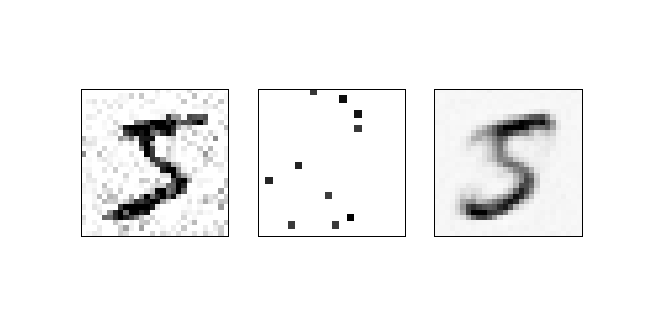

<IPython.core.display.Javascript object>


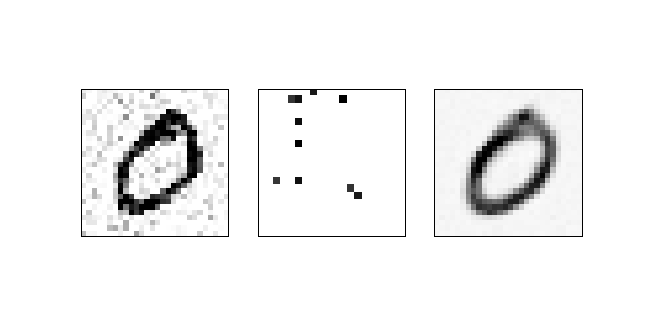

<IPython.core.display.Javascript object>


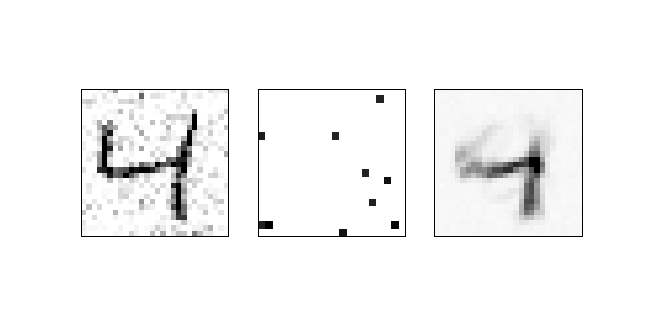

<IPython.core.display.Javascript object>


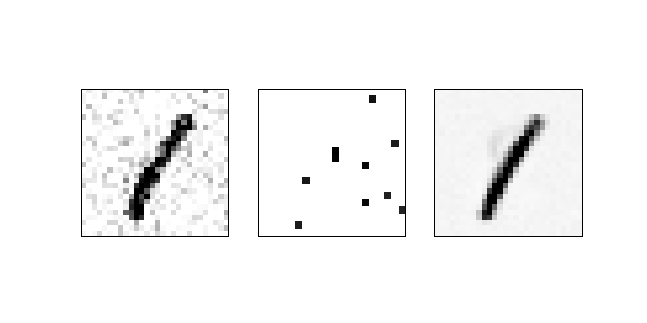

<IPython.core.display.Javascript object>


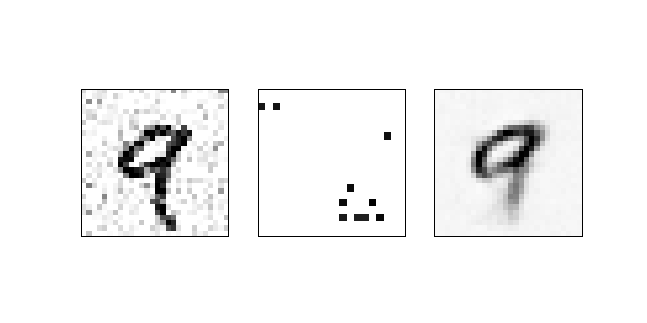

<IPython.core.display.Javascript object>


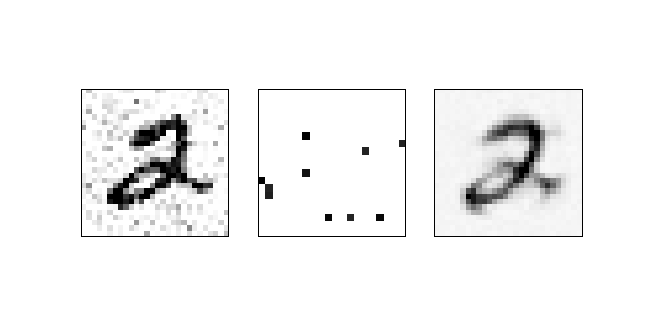

<IPython.core.display.Javascript object>


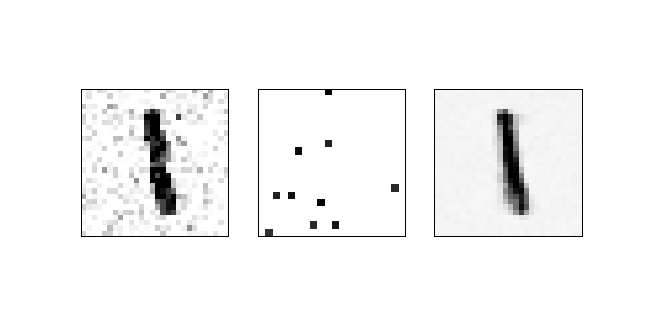

<IPython.core.display.Javascript object>


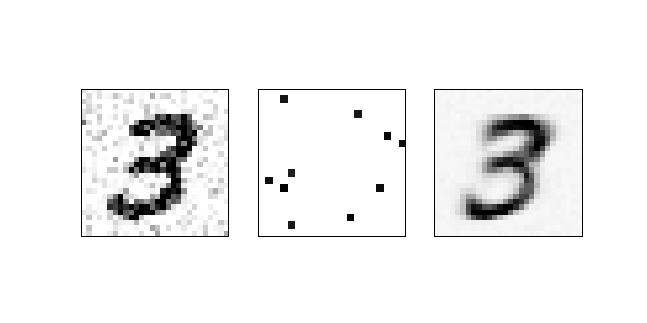

<IPython.core.display.Javascript object>


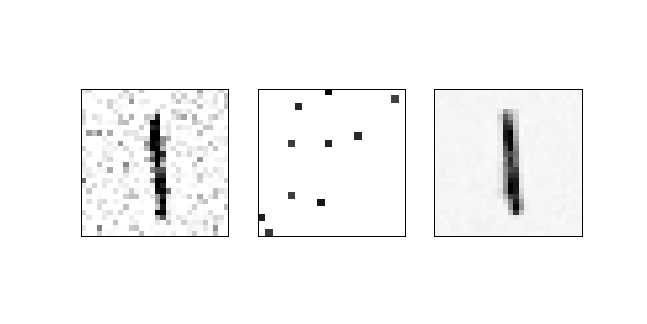

<IPython.core.display.Javascript object>


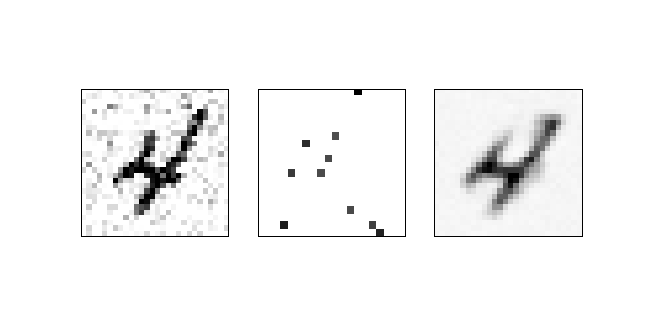

In [26]:
offset = 0

for i in range(10):
    reconstruct(i + offset, w, Kx, Ky)

<IPython.core.display.Javascript object>


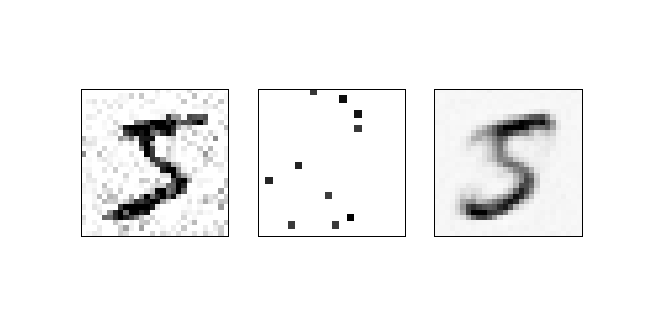

In [27]:
img_i = 0

s_len = 28

img = gp_noise[img_i]

v = img.reshape(-1, 1)
p = w @ v
winners = cp.argsort(p, axis=0)[-n_w:]
mask = cp.zeros((N, 1))
mask[winners] = 1
o = mask * p
r = w.T @ o

plt.figure(figsize=(8, 4))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len).get(), cmap="Greys", vmax=1, vmin=0)

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(Ky, Kx).get(), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len).get(), cmap="Greys", vmax=1, vmin=0)

plt.show()

In [29]:
min(r)

array([0.03492534])

That's super awesome!  I'm going to try 900, and then I might even do more noise.

<IPython.core.display.Javascript object>


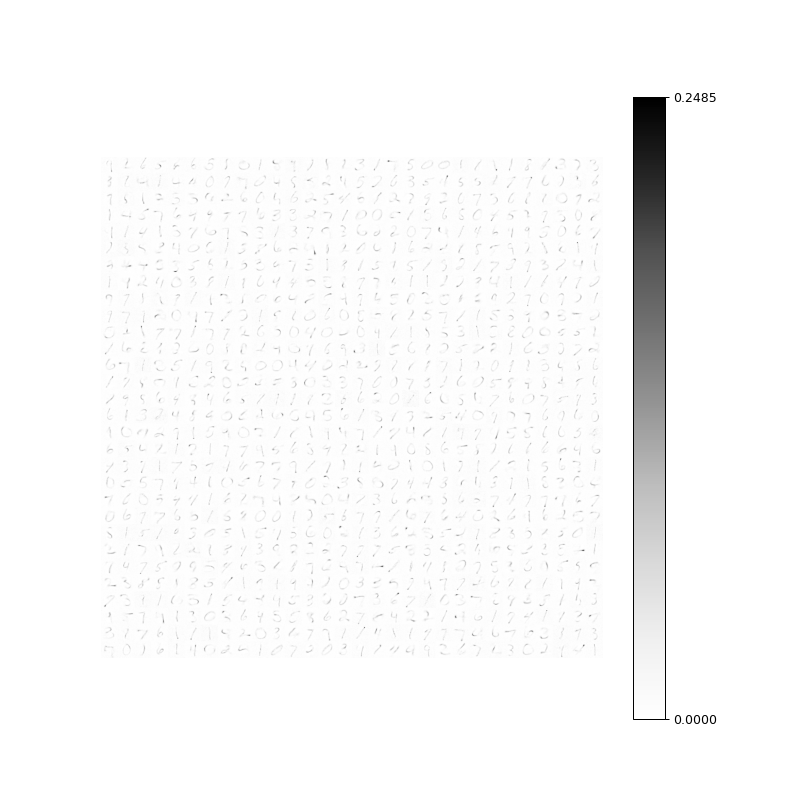

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12000/12000 [00:15<00:00, 796.35it/s]


In [31]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 10
T_s = 12000

Kx = 30
Ky = 30
m_len = 28 * 28 
tr_len = 60000

prec = 1e-10

n_w = 10 #Number of winners

N = Kx * Ky

# Feedforward
w = cp.random.uniform(0, 0.4, (N, m_len))
xi = 0.01

for ep in range(Nep):
    inputs = gp_noise[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        p = w @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((N, 1))
        mask[winners] = 1
        o = mask * p
        r = w.T @ o
        mod_r = cp.maximum(r, prec)
        e = v - r

        w += w * o * (e / mod_r).T * xi

    draw_weights(w.get(), Kx, Ky, 28, fig)

Two epochs of 900 neurons in 3 minutes?? What's that, you ask?  Let's say it together! *deeply dope*.  Aight, let's do reconstructions!

<IPython.core.display.Javascript object>


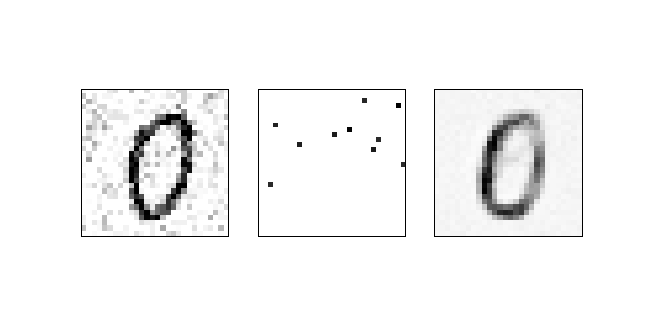

<IPython.core.display.Javascript object>


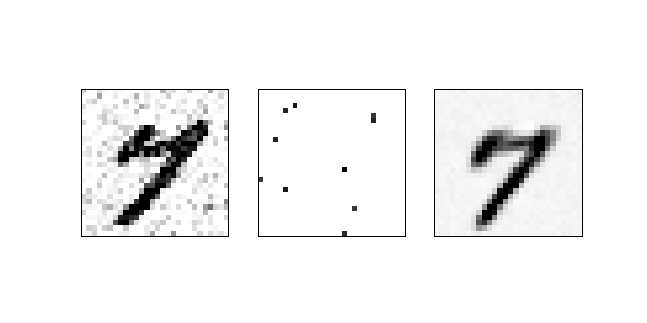

<IPython.core.display.Javascript object>


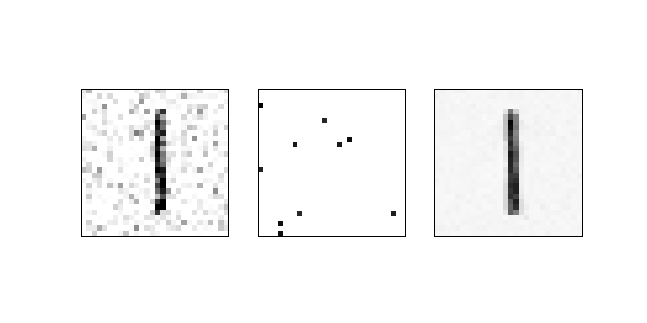

<IPython.core.display.Javascript object>


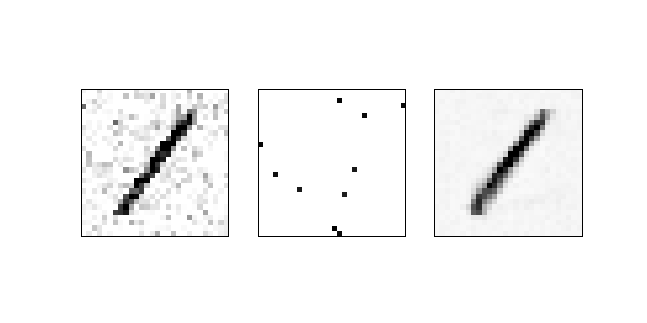

<IPython.core.display.Javascript object>


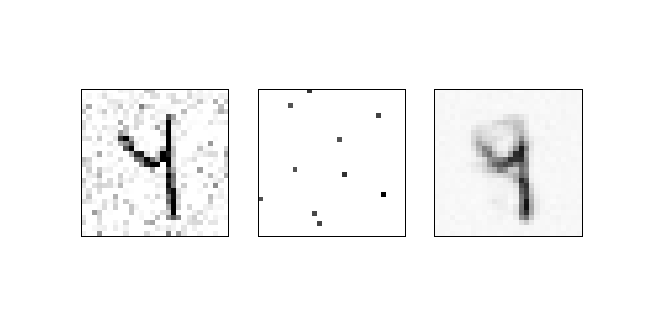

<IPython.core.display.Javascript object>


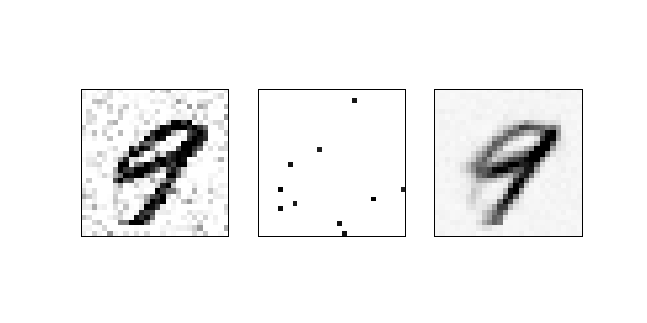

<IPython.core.display.Javascript object>


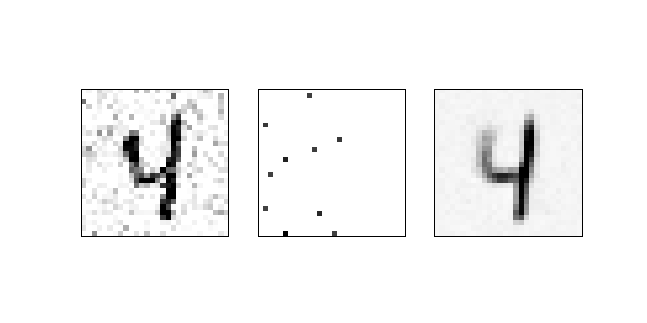

<IPython.core.display.Javascript object>


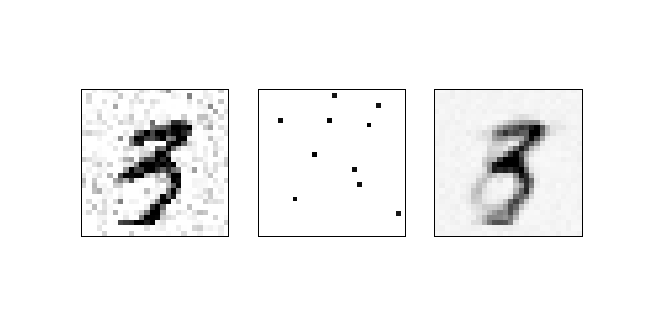

<IPython.core.display.Javascript object>


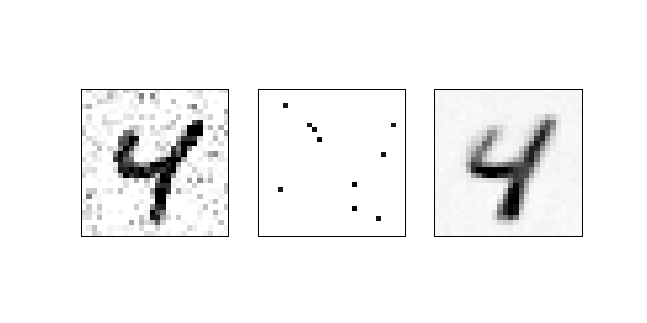

<IPython.core.display.Javascript object>


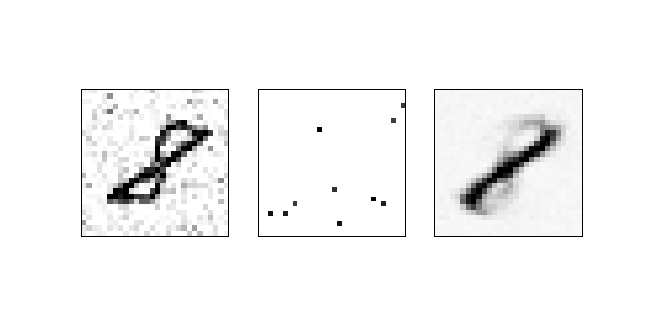

In [33]:
offset = 1000

for i in range(10):
    reconstruct(i + offset, w, Kx, Ky)

Well that's incredibly awesome.  Also, pro-tip.  I started the weights between 0 and 0.3, and I think that should safely prevent overflows, or huge initial over-corrections.  

You know what?  I'm going to try 15 winners, and see how the network does.

<IPython.core.display.Javascript object>


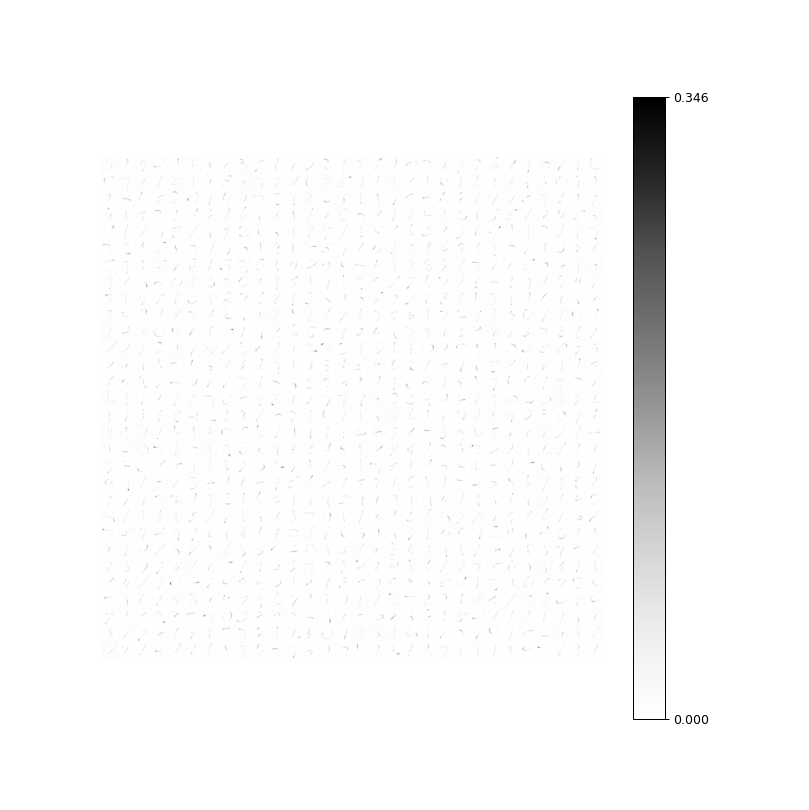

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12000/12000 [00:16<00:00, 722.78it/s]


In [34]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 10
T_s = 12000

Kx = 30
Ky = 30
m_len = 28 * 28 
tr_len = 60000

prec = 1e-10

n_w = 15 #Number of winners

N = Kx * Ky

# Feedforward
w = cp.random.uniform(0, 0.4, (N, m_len))
xi = 0.02

for ep in range(Nep):
    inputs = gp_noise[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        p = w @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((N, 1))
        mask[winners] = 1
        o = mask * p
        r = w.T @ o
        mod_r = cp.maximum(r, prec)
        e = v - r

        w += w * o * (e / mod_r).T * xi

    draw_weights(w.get(), Kx, Ky, 28, fig)

<IPython.core.display.Javascript object>


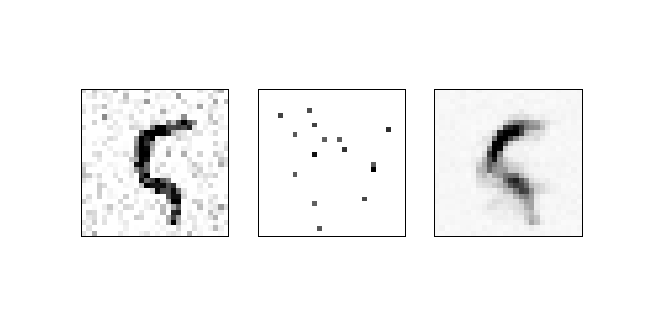

<IPython.core.display.Javascript object>


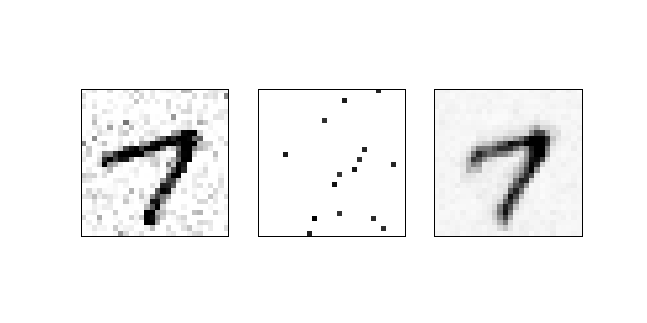

<IPython.core.display.Javascript object>


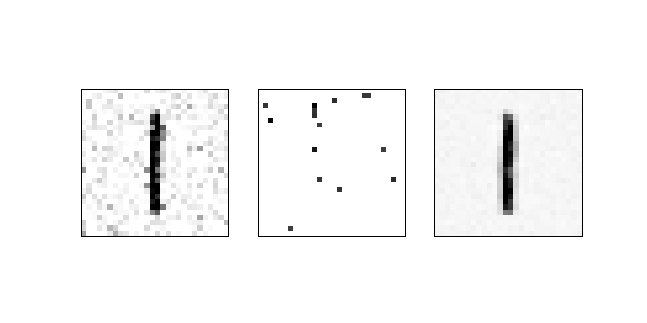

<IPython.core.display.Javascript object>


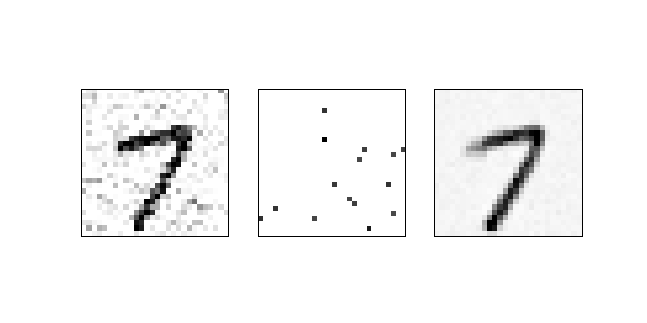

<IPython.core.display.Javascript object>


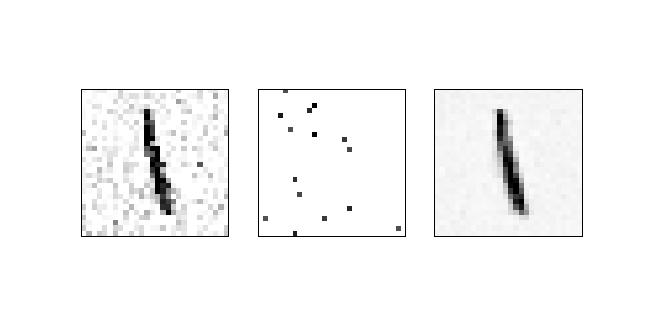

<IPython.core.display.Javascript object>


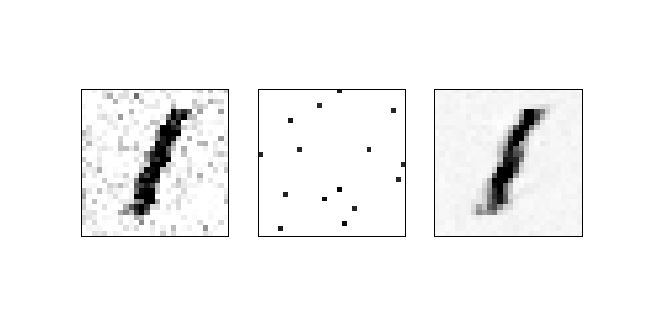

<IPython.core.display.Javascript object>


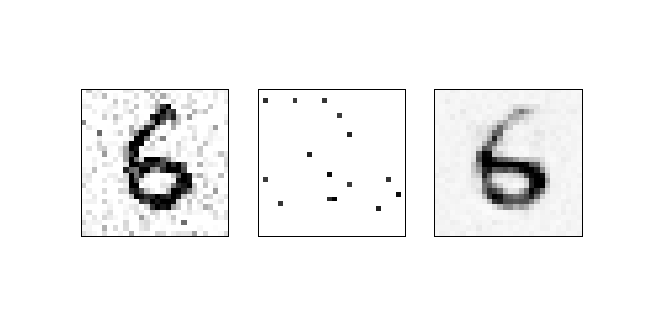

<IPython.core.display.Javascript object>


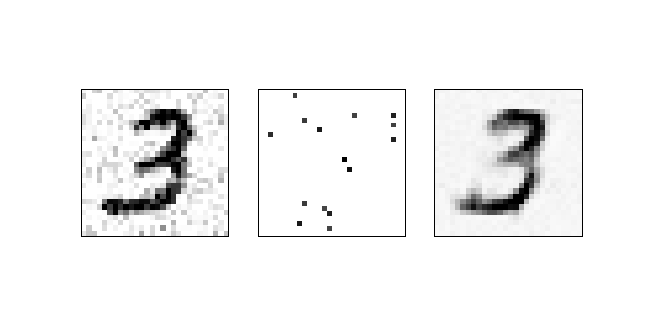

<IPython.core.display.Javascript object>


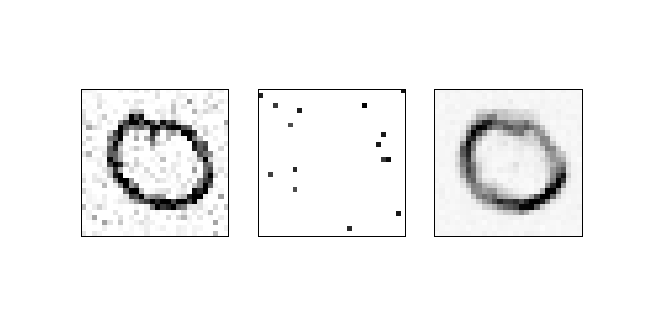

<IPython.core.display.Javascript object>


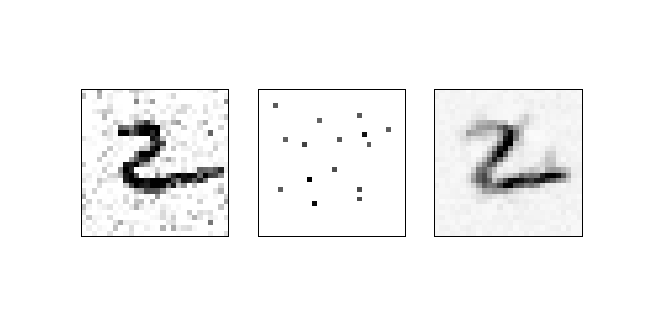

In [36]:
offset = 100

for i in range(10):
    reconstruct(i + offset, w, Kx, Ky)

Well, that's pretty awesome.  At a certain point, if I have too many winners, then the network is going to start reconstructing the noise.  Actually, maybe that's a good way to determine the desired number of winners.  What I'm thinking is you have noisy images, and clean images, you train the network, and then you choose the number of winners required to minimize reconstruction error.  That'd actually be an incredibly interesting experiment.  I might run that in a bit.  

First though, I want to try something.  So basically, there's a small amount of base noise in the reconstructions.  So I'm just going to subtract out the smallest minimum value from the prototypes every 100-1000 iterations through the loop.  That might help the neurons keep their eyes on the prize, so to spake. (Yes, MF, SPAKE)

<IPython.core.display.Javascript object>


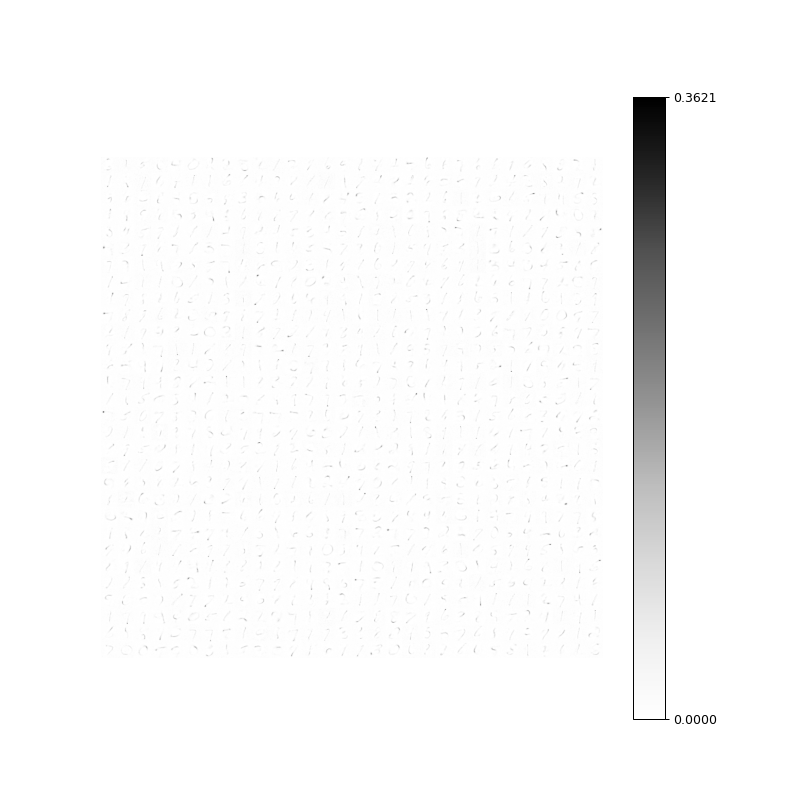

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12000/12000 [00:17<00:00, 675.62it/s]


In [4]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 10
T_s = 12000

Kx = 30
Ky = 30
m_len = 28 * 28 
tr_len = 60000

prec = 1e-10

n_w = 15 #Number of winners

N = Kx * Ky

# Feedforward
w = cp.random.uniform(0, 0.4, (N, m_len))
xi = 0.02

for ep in range(Nep):
    inputs = gp_noise[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        p = w @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((N, 1))
        mask[winners] = 1
        o = mask * p
        r = w.T @ o
        mod_r = cp.maximum(r, prec)
        e = v - r

        w += w * o * (e / mod_r).T * xi
        
        if i % 500 == 0:
            w -= np.min(w, axis=1).reshape(-1, 1)

    draw_weights(w.get(), Kx, Ky, 28, fig)

<IPython.core.display.Javascript object>


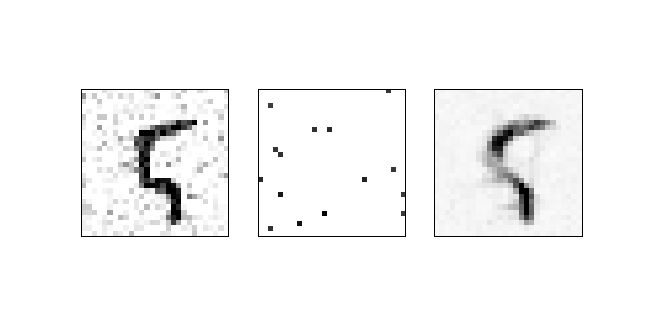

<IPython.core.display.Javascript object>


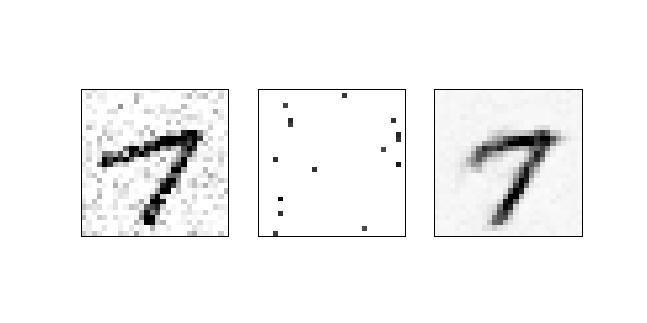

<IPython.core.display.Javascript object>


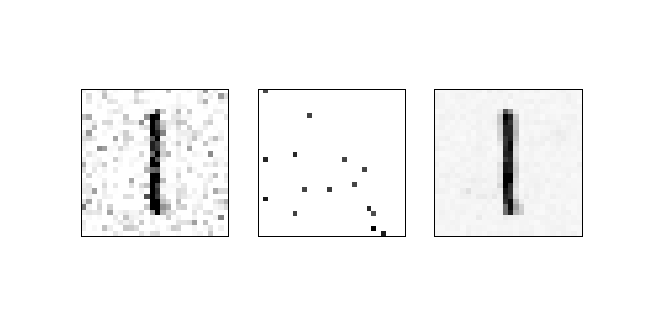

<IPython.core.display.Javascript object>


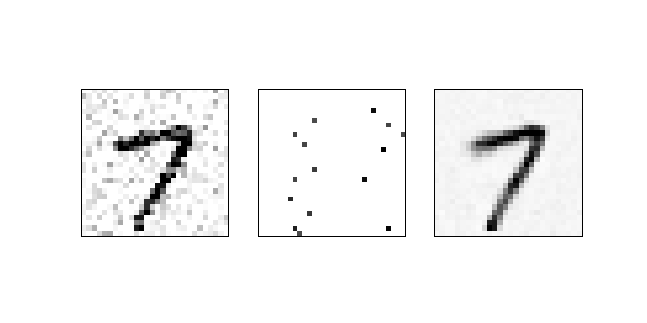

<IPython.core.display.Javascript object>


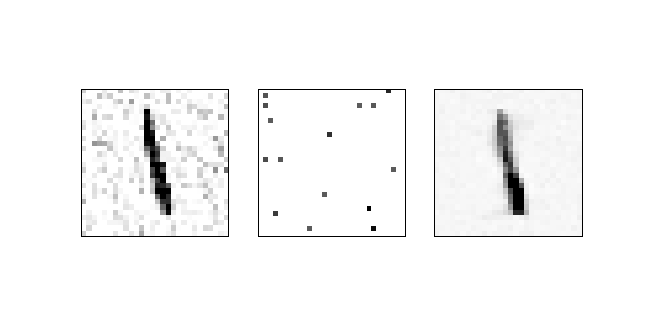

<IPython.core.display.Javascript object>


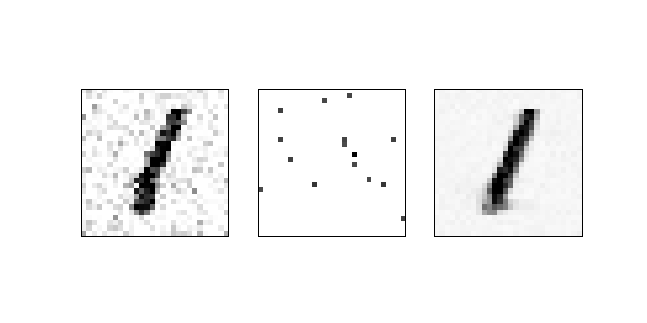

<IPython.core.display.Javascript object>


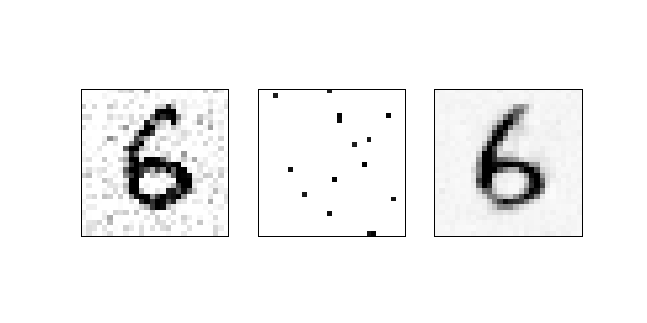

<IPython.core.display.Javascript object>


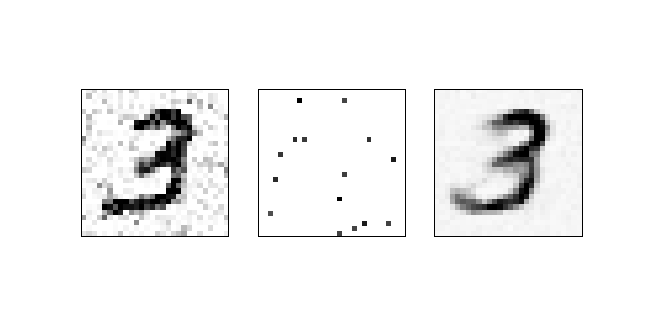

<IPython.core.display.Javascript object>


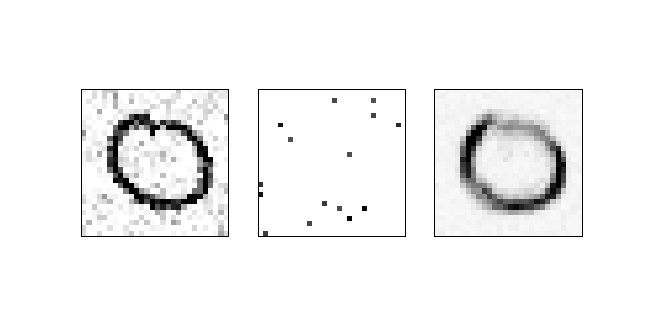

<IPython.core.display.Javascript object>


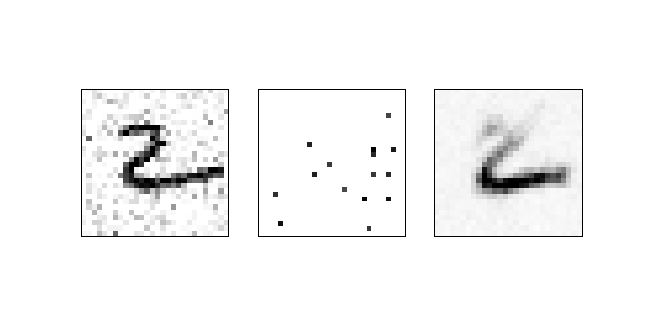

In [7]:
offset = 100

for i in range(10):
    reconstruct(i + offset, w, Kx, Ky)

Eh, I don't know if there's all that much difference.

Ok, now for the really fun stuff.  I'm going to really, really corrupt the images, and we'll see how good the network can build them back up!

I'm also going to modify the `reconstruct` function to take specific data, so that's going to mess with previous cells if you try to re-run them in the future.

Let's start with 400 neurons, 10 winners.

In [24]:
m_noise5 = np.clip(m_flat_tr + np.random.normal(0, 0.5, m_flat_tr.shape), 0, 1)
gp_noise5 = cp.asarray(m_noise5)

<IPython.core.display.Javascript object>


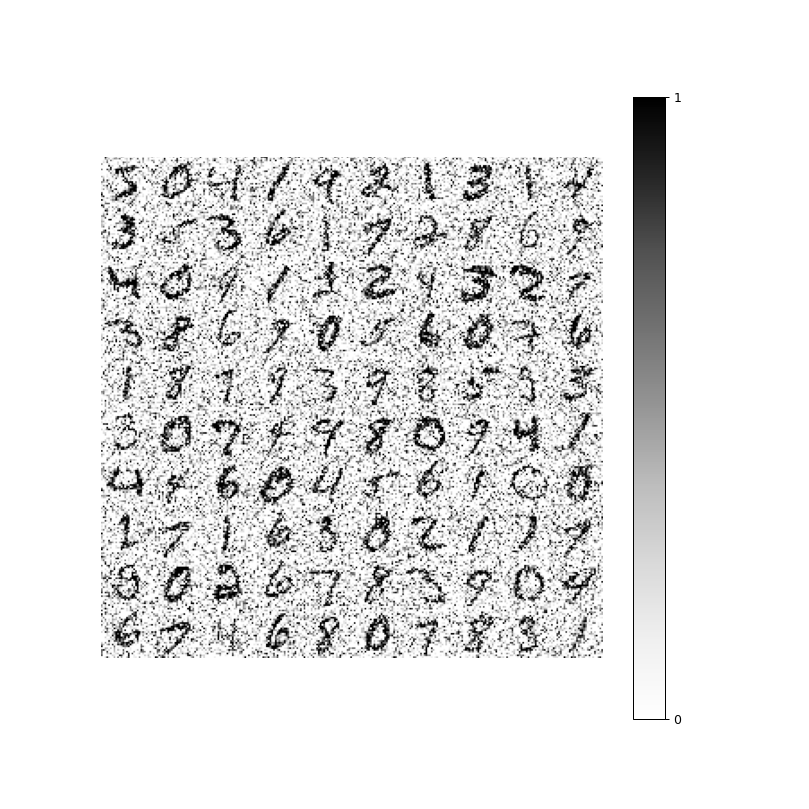

In [25]:
fig = plt.figure(figsize=(10, 10))

draw_weights(m_noise5, 10, 10, 28, fig)

Oh, look at that data!  Man that's rough.  Let's see how the network does!!

<IPython.core.display.Javascript object>


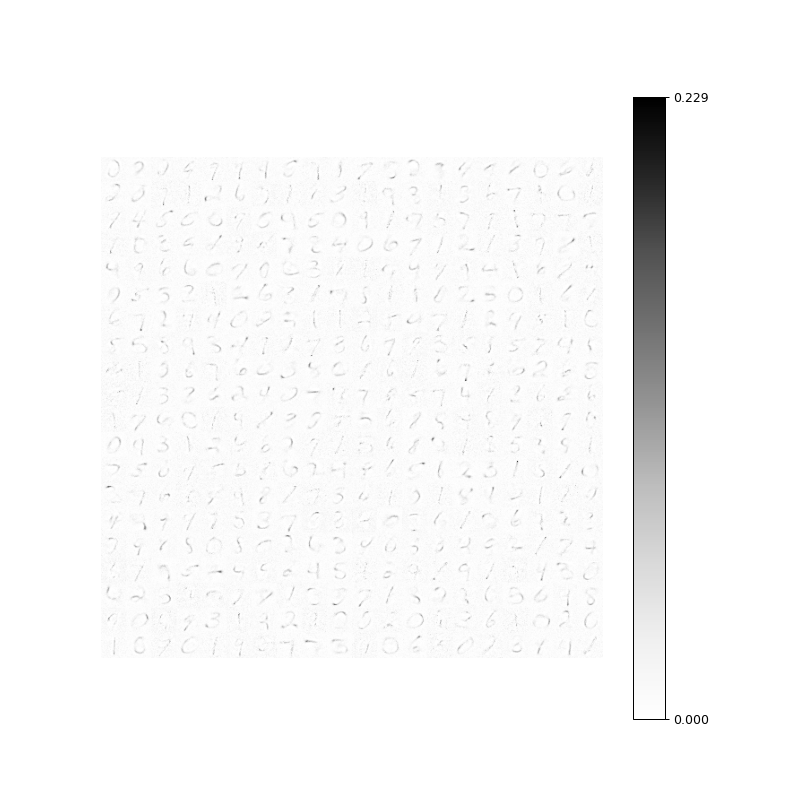

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12000/12000 [00:20<00:00, 583.26it/s]


In [27]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 10
T_s = 12000

Kx = 20
Ky = 20
m_len = 28 * 28 
tr_len = 60000

prec = 1e-10

n_w = 10 #Number of winners

N = Kx * Ky

# Feedforward
w = cp.random.uniform(0, 0.4, (N, m_len))
xi = 0.005

for ep in range(Nep):
    inputs = gp_noise5[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        p = w @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((N, 1))
        mask[winners] = 1
        o = mask * p
        r = w.T @ o
        mod_r = cp.maximum(r, prec)
        e = v - r

        w += w * o * (e / mod_r).T * xi
        
        if i % 500 == 0:
            w -= np.min(w, axis=1).reshape(-1, 1)

    draw_weights(w.get(), Kx, Ky, 28, fig)

I let that bad boi run it's full cycle, but the prototypes started settling down after maybe 4-5 mini-epochs, so probably about a full epoch of data.  That means that the network is finding the prototypes fairly rapidly.  When I used `xi = 0.02`, the network found prototypes after one mini-epoch.  Granted, they weren't super good, but still.  Pretty dope.  Alright! I have high hopes for reconstructions!

Edit: I had still been using the old data for training when I wrote the above entry.  With the noisier data it's taking a longer time for the network to converge.

<IPython.core.display.Javascript object>


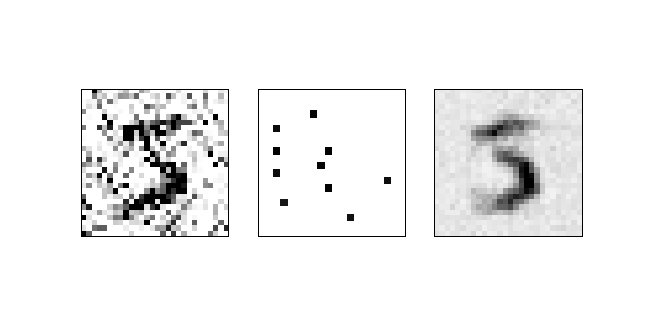

<IPython.core.display.Javascript object>


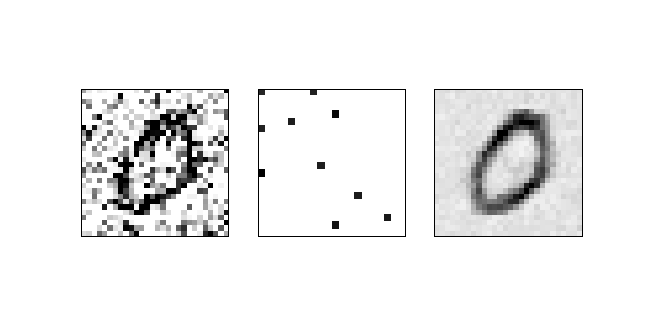

<IPython.core.display.Javascript object>


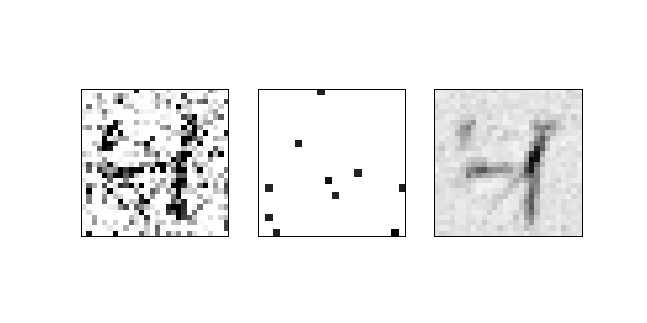

<IPython.core.display.Javascript object>


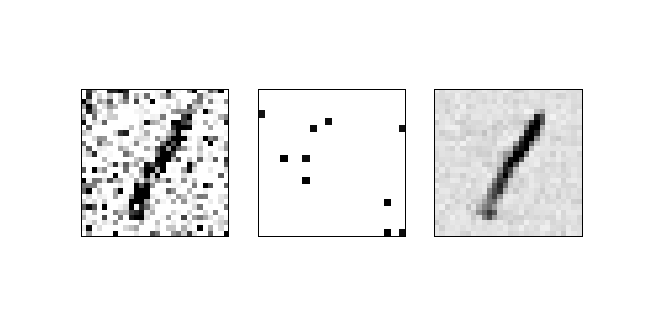

<IPython.core.display.Javascript object>


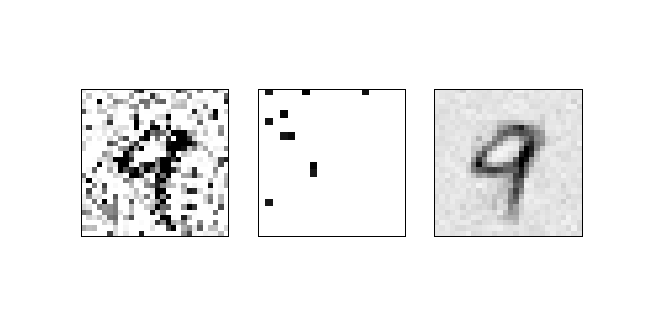

<IPython.core.display.Javascript object>


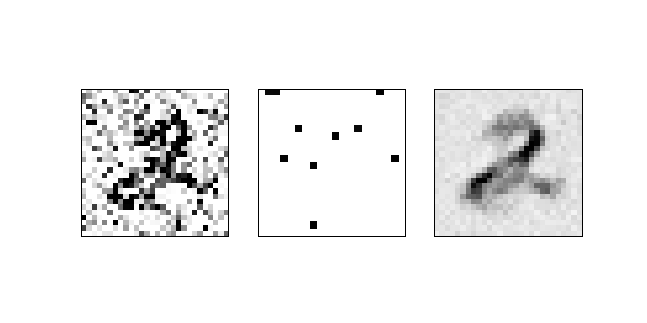

<IPython.core.display.Javascript object>


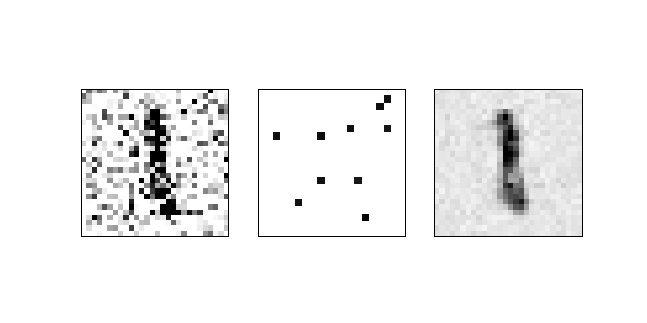

<IPython.core.display.Javascript object>


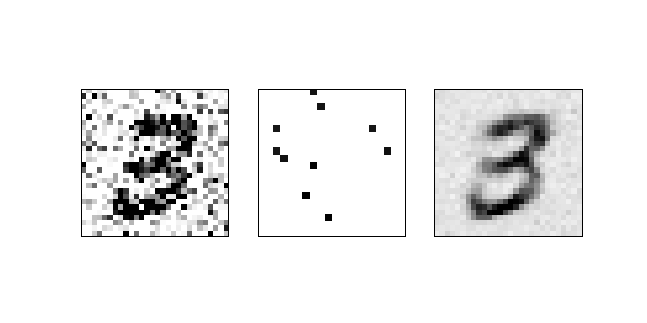

<IPython.core.display.Javascript object>


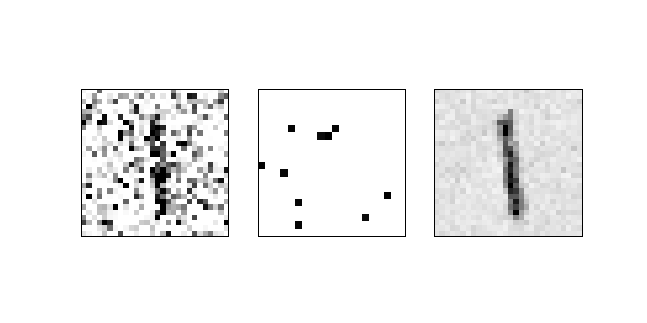

<IPython.core.display.Javascript object>


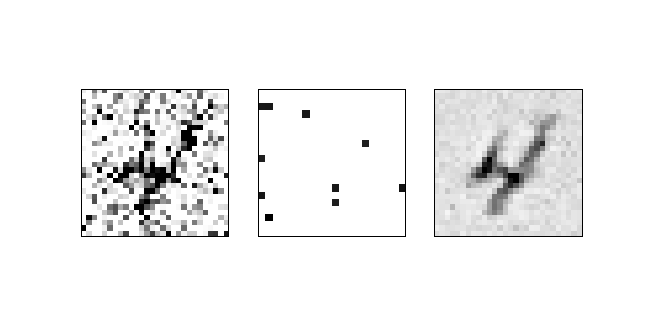

In [28]:
offset = 0

for i in range(10):
    reconstruct(i + offset, w, Kx, Ky, gp_noise5)

All things considered, those reconstructions are pretty incredible.  However, I have an idea about how to make them even better.  

Actually, no.  Never mind.  I was going to simply zero the prototypes beneath a certain threshold...

Actually never mind 2.0.  I think I am going to do that.  And I think I'm actually going to do that pretty frequently.  

Yeah, ok.  I'm going to zero out any numbers 1 standard deviation below the mean.  Cool. Let's see how that does.

<IPython.core.display.Javascript object>


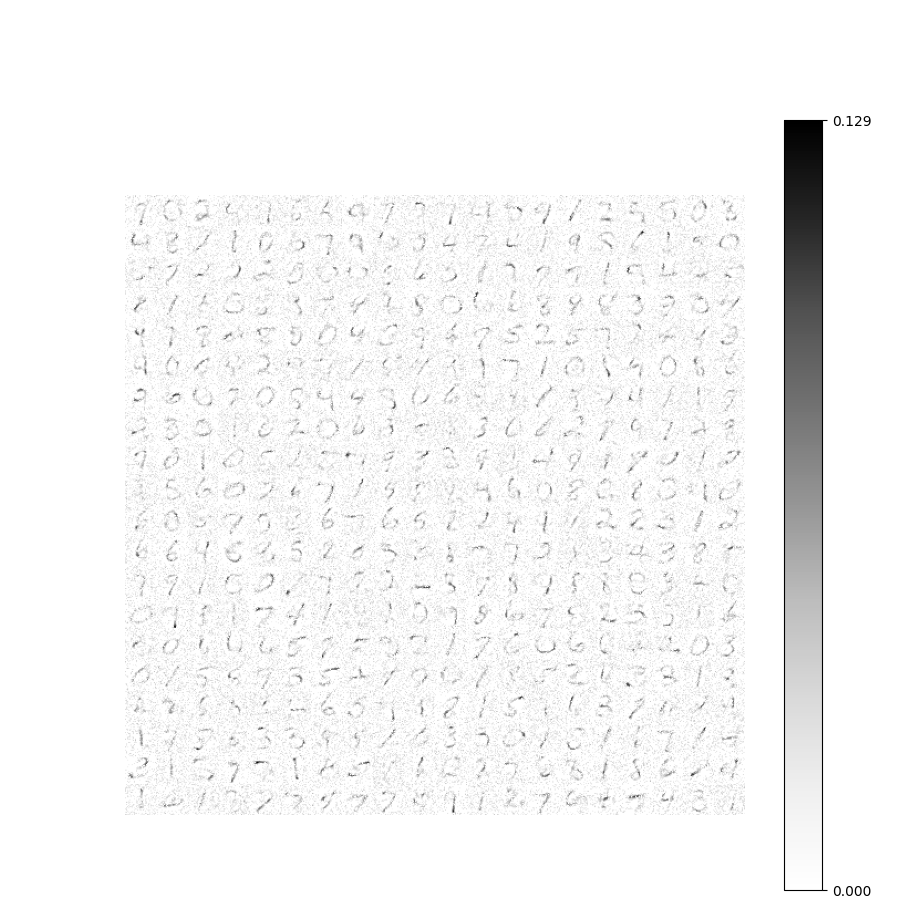

 37%|████████████████████████████████████████████████████████████▊                                                                                                        | 4425/12000 [00:03<00:06, 1195.29it/s]


KeyboardInterrupt: 

In [53]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 10
T_s = 12000

Kx = 20
Ky = 20
m_len = 28 * 28 
tr_len = 60000

prec = 1e-10

n_w = 10 #Number of winners

N = Kx * Ky

# Feedforward
w = cp.random.uniform(0, 0.4, (N, m_len))
xi = 0.005

for ep in range(Nep):
    inputs = gp_noise5[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        p = w @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((N, 1))
        mask[winners] = 1
        o = mask * p
        r = w.T @ o
        mod_r = cp.maximum(r, prec)
        e = v - r

        w += w * o * (e / mod_r).T * xi
        
        if i % 100 == 0:
            w = np.where(w > 0.01, w, 0)

    draw_weights(w.get(), Kx, Ky, 28, fig)

<IPython.core.display.Javascript object>


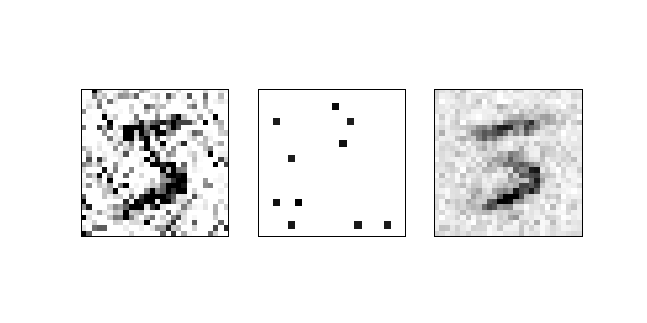

<IPython.core.display.Javascript object>


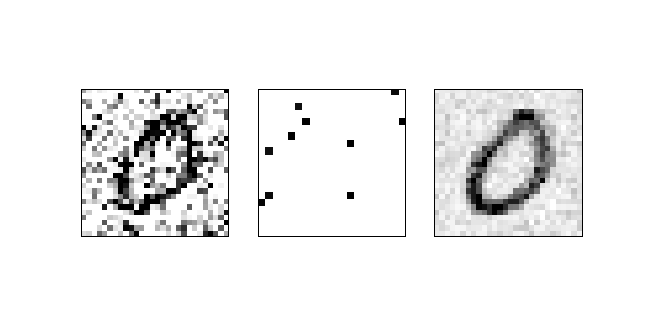

<IPython.core.display.Javascript object>


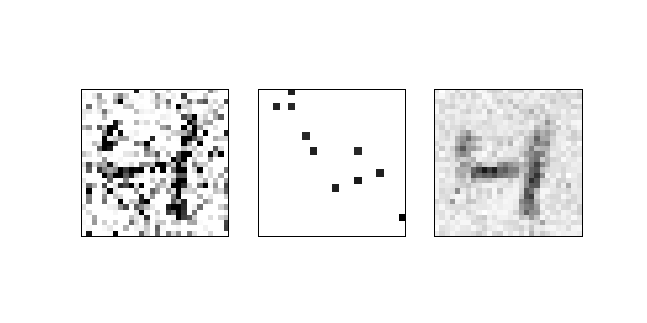

<IPython.core.display.Javascript object>


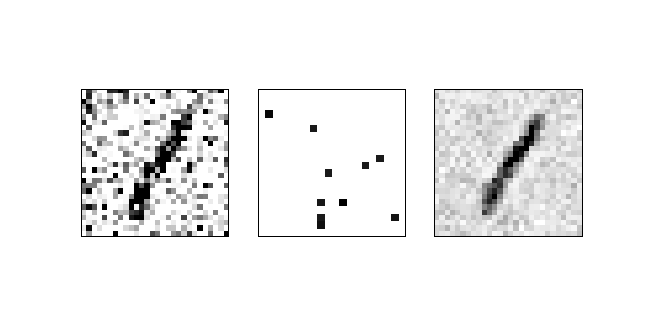

<IPython.core.display.Javascript object>


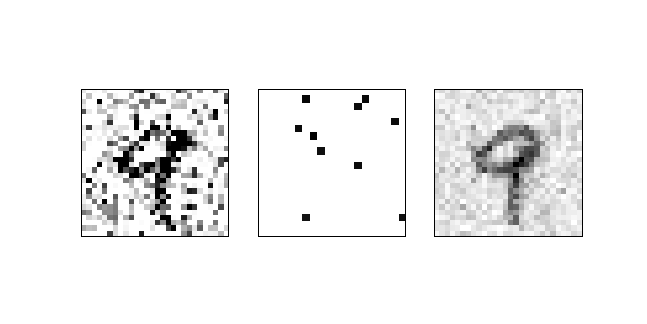

<IPython.core.display.Javascript object>


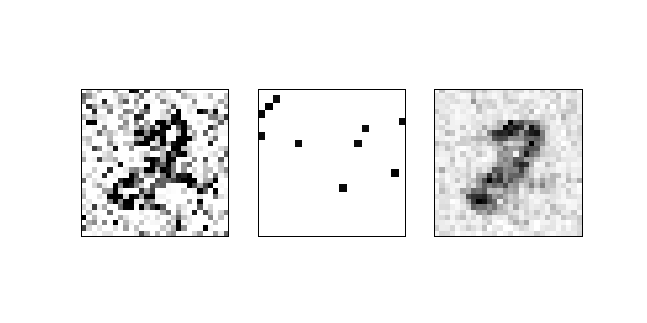

<IPython.core.display.Javascript object>


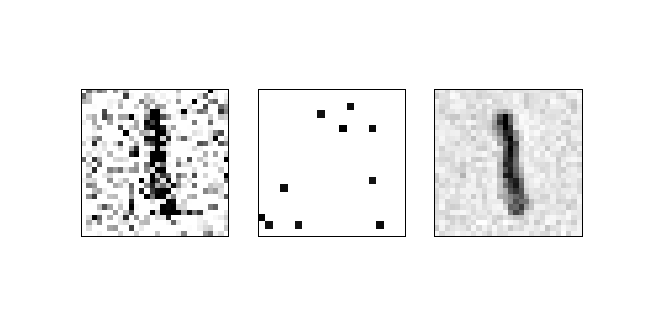

<IPython.core.display.Javascript object>


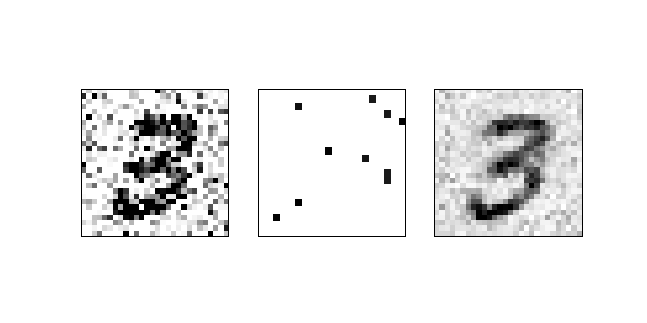

<IPython.core.display.Javascript object>


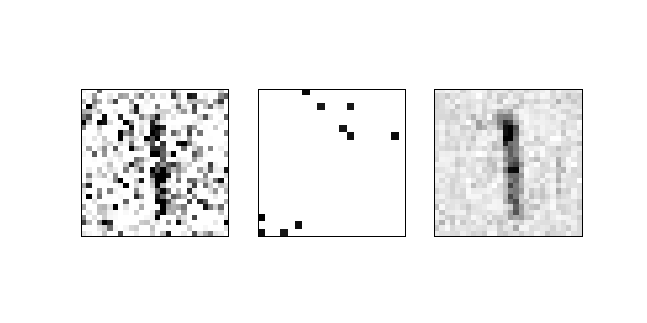

<IPython.core.display.Javascript object>


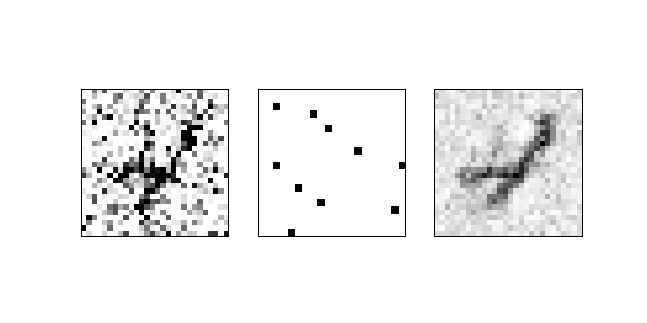

In [54]:
offset = 0

for i in range(10):
    reconstruct(i + offset, w, Kx, Ky, gp_noise5)

Ok, I don't really know why, but doing that thresholding actually didn't work very well at all.  Here's what I'll try.  I'm going simply train the neurons as I did before, and then at the very end, when I do reconstructions, I'm going to remove the background.  We'll see how that does.

I'm also going to bump `xi` to make it go faster.  Frack `xi = 0.005`.

<IPython.core.display.Javascript object>


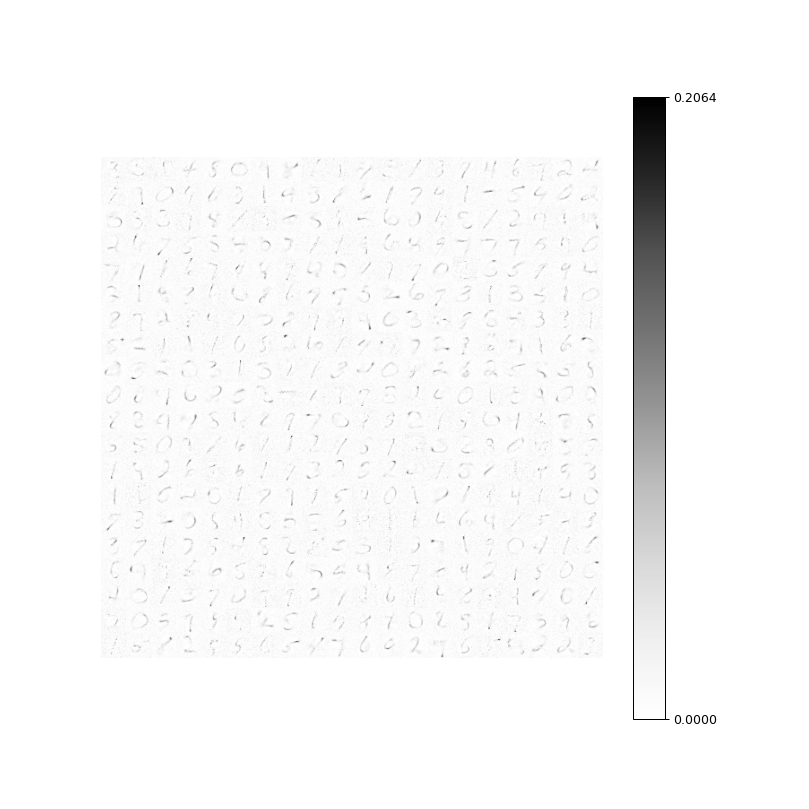

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12000/12000 [00:09<00:00, 1248.01it/s]


In [55]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 5
T_s = 12000

Kx = 20
Ky = 20
m_len = 28 * 28 
tr_len = 60000

prec = 1e-10

n_w = 10 #Number of winners

N = Kx * Ky

# Feedforward
w = cp.random.uniform(0, 0.4, (N, m_len))
xi = 0.01

for ep in range(Nep):
    inputs = gp_noise5[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        p = w @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((N, 1))
        mask[winners] = 1
        o = mask * p
        r = w.T @ o
        mod_r = cp.maximum(r, prec)
        e = v - r

        w += w * o * (e / mod_r).T * xi

    draw_weights(w.get(), Kx, Ky, 28, fig)

<IPython.core.display.Javascript object>


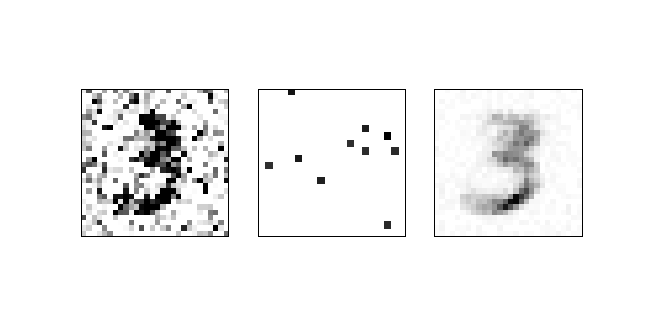

<IPython.core.display.Javascript object>


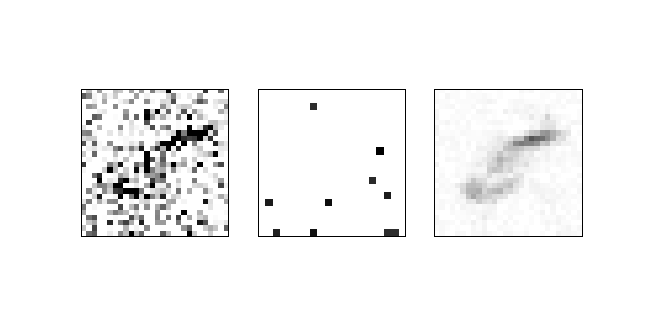

<IPython.core.display.Javascript object>


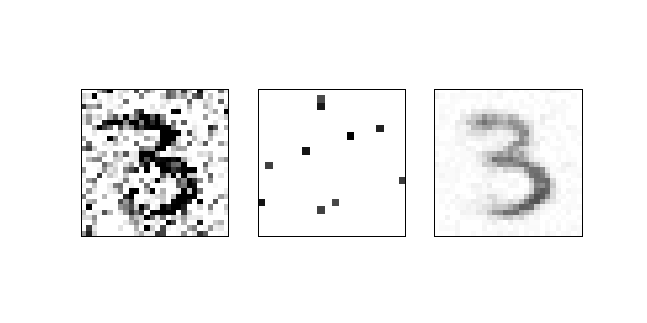

<IPython.core.display.Javascript object>


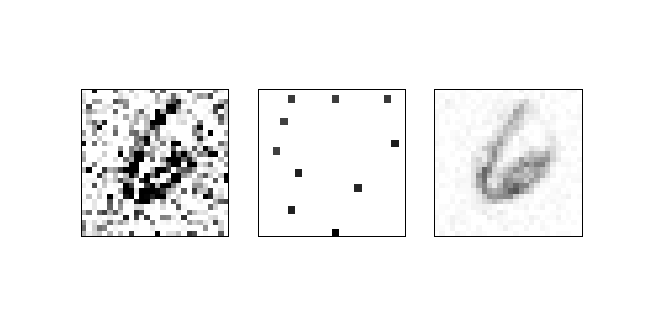

<IPython.core.display.Javascript object>


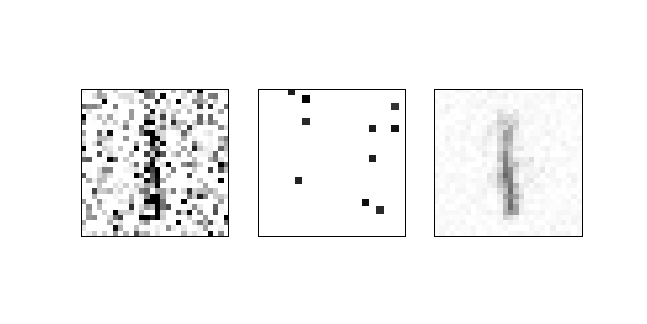

<IPython.core.display.Javascript object>


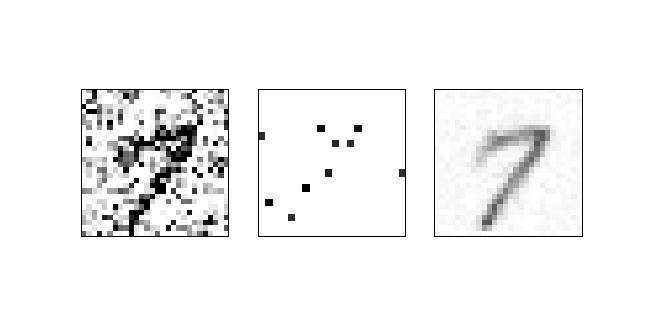

<IPython.core.display.Javascript object>


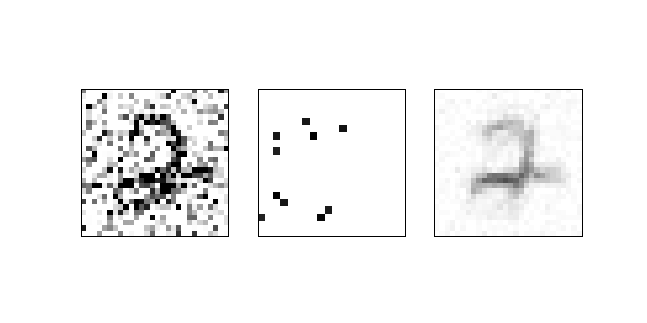

<IPython.core.display.Javascript object>


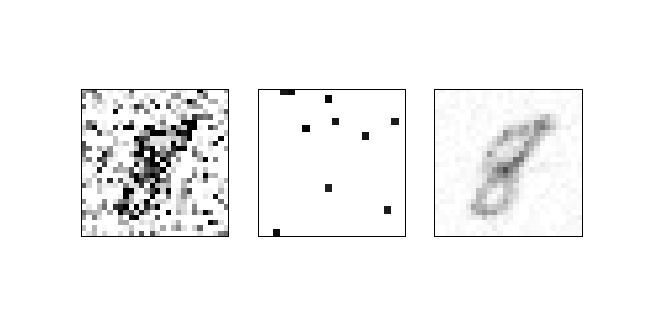

<IPython.core.display.Javascript object>


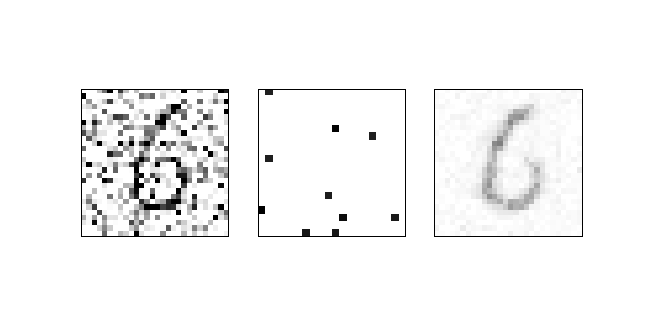

<IPython.core.display.Javascript object>


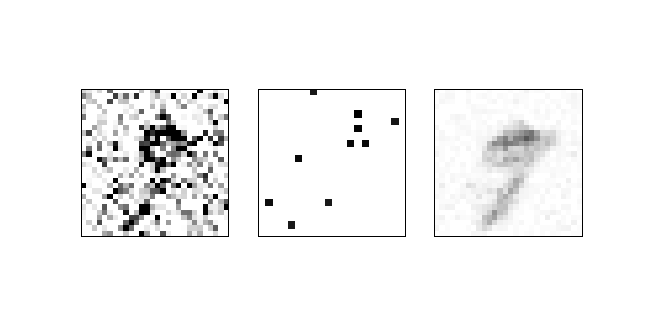

In [70]:
offset = 10

for i in range(10):
#     reconstruct(i, w, Kx, Ky, gp_noise5)
    reconstruct(i + offset, cp.where(w > 1.5 * cp.mean(w, axis=1).reshape(-1, 1), w, 0), Kx, Ky, gp_noise5)

Hmm, I guess it does, but still.  That level of noise is indicative of something going on in the noisy area, so it's probably best just to keep it.  Here's the reconstruction with the noise, again.

<IPython.core.display.Javascript object>


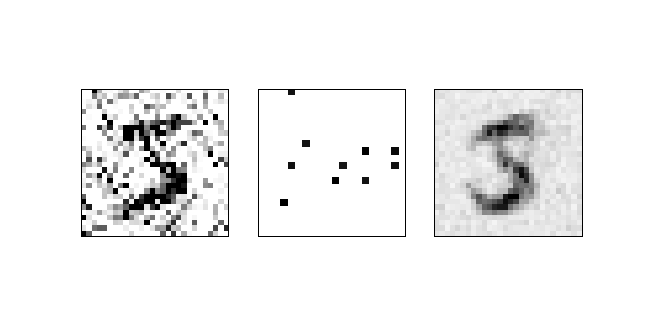

<IPython.core.display.Javascript object>


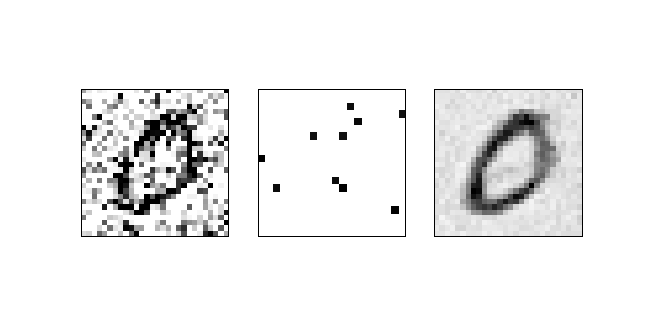

<IPython.core.display.Javascript object>


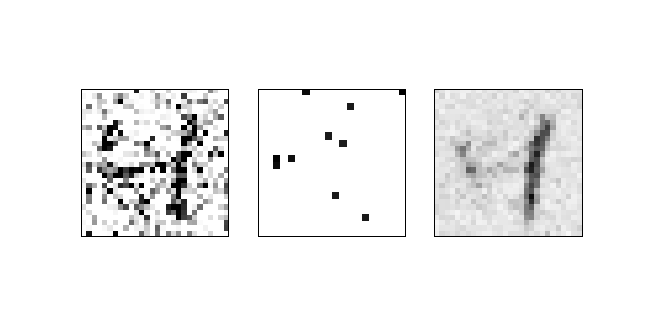

<IPython.core.display.Javascript object>


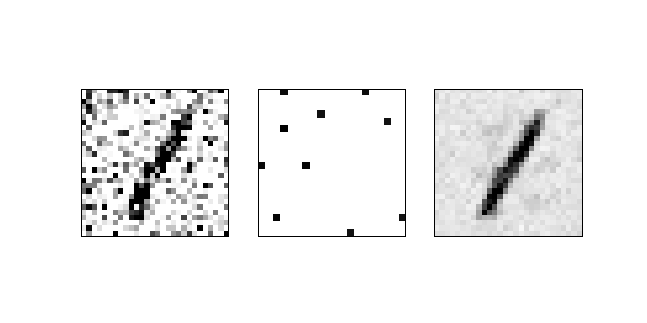

<IPython.core.display.Javascript object>


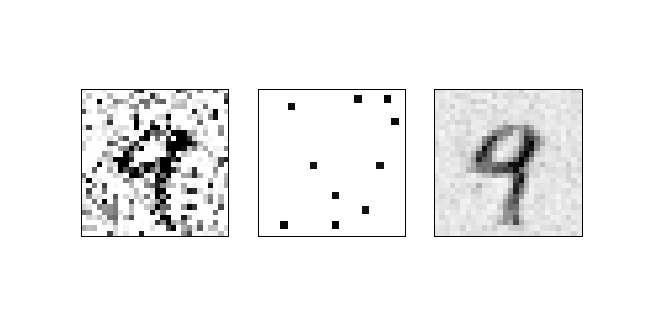

<IPython.core.display.Javascript object>


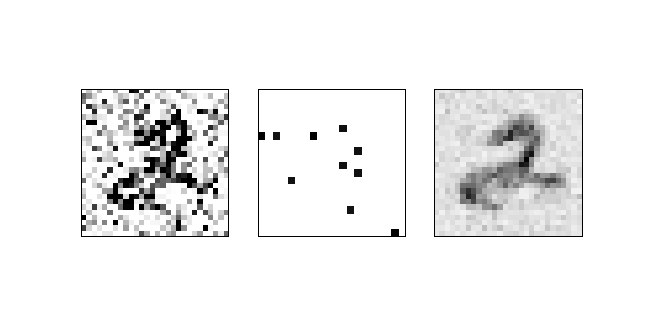

<IPython.core.display.Javascript object>


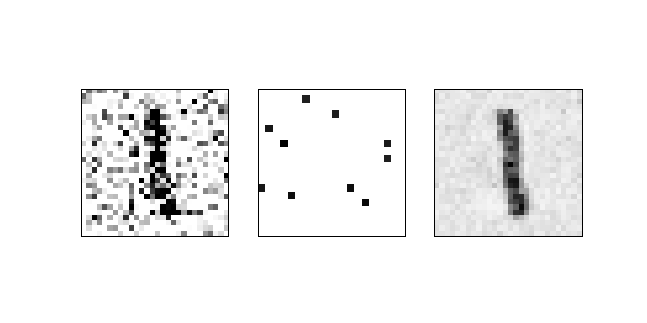

<IPython.core.display.Javascript object>


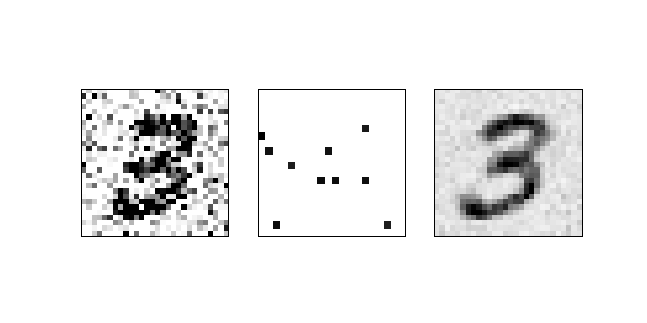

<IPython.core.display.Javascript object>


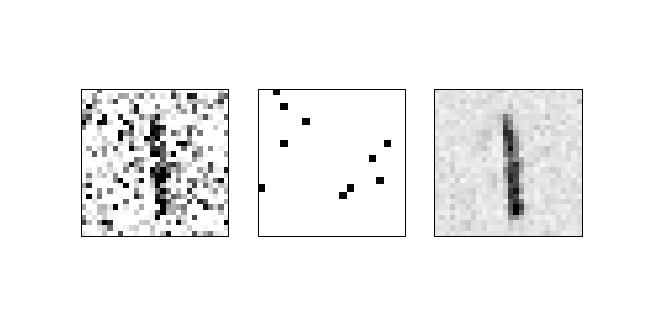

<IPython.core.display.Javascript object>


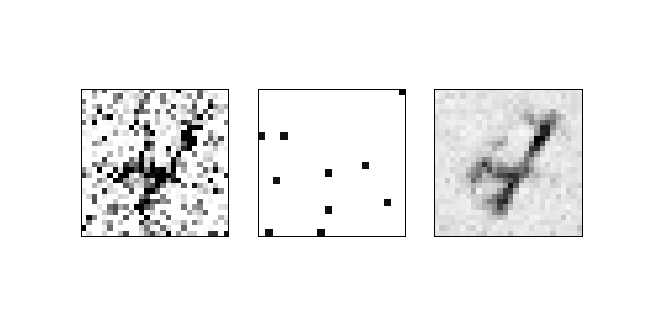

In [73]:
offset = 0

for i in range(10):
    reconstruct(i, w, Kx, Ky, gp_noise5)

Ok, I'm going to train the network with this level of noise on 900 neurons.  Then I'm going to create a new noise signature.

<IPython.core.display.Javascript object>


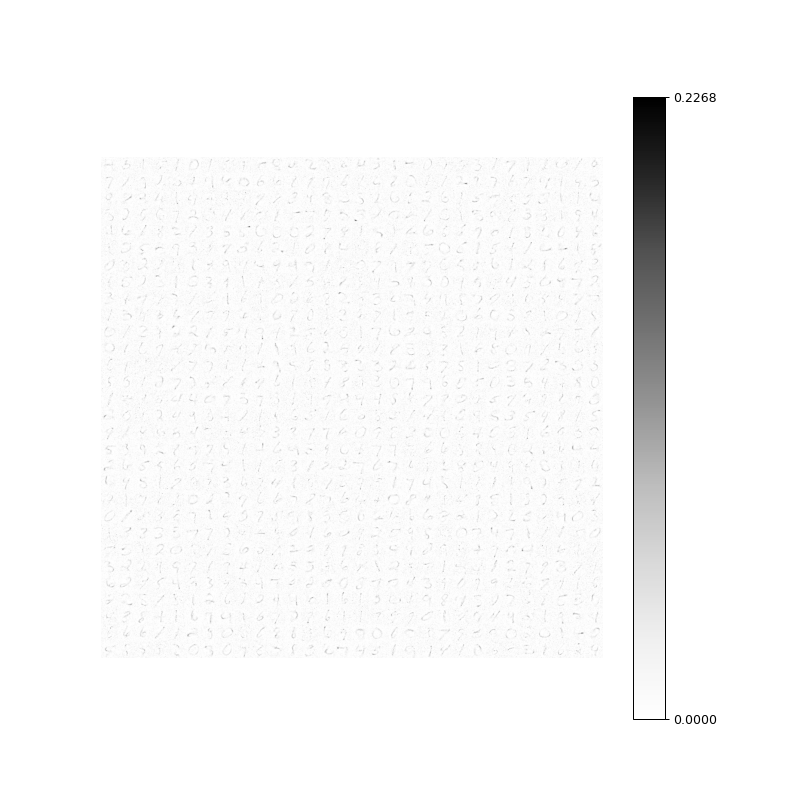

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12000/12000 [00:17<00:00, 693.77it/s]


In [75]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 5
T_s = 12000

Kx = 30
Ky = 30
m_len = 28 * 28 
tr_len = 60000

prec = 1e-10

n_w = 10 #Number of winners

N = Kx * Ky

# Feedforward
w = cp.random.uniform(0, 0.2, (N, m_len))
xi = 0.03

for ep in range(Nep):
    inputs = gp_noise5[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        p = w @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((N, 1))
        mask[winners] = 1
        o = mask * p
        r = w.T @ o
        mod_r = cp.maximum(r, prec)
        e = v - r

        w += w * o * (e / mod_r).T * xi

    draw_weights(w.get(), Kx, Ky, 28, fig)

<IPython.core.display.Javascript object>


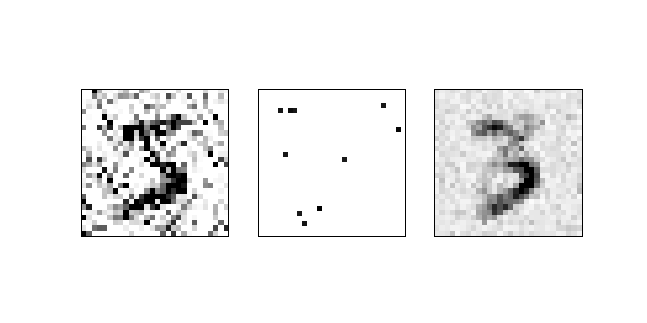

<IPython.core.display.Javascript object>


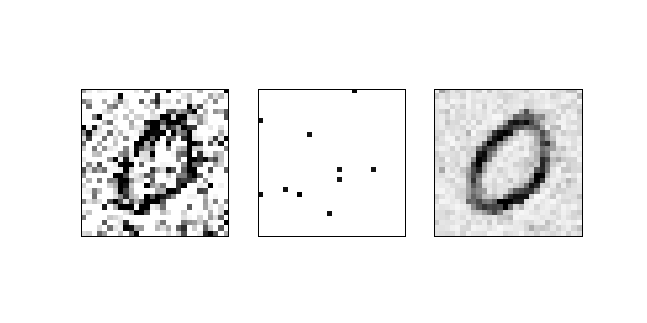

<IPython.core.display.Javascript object>


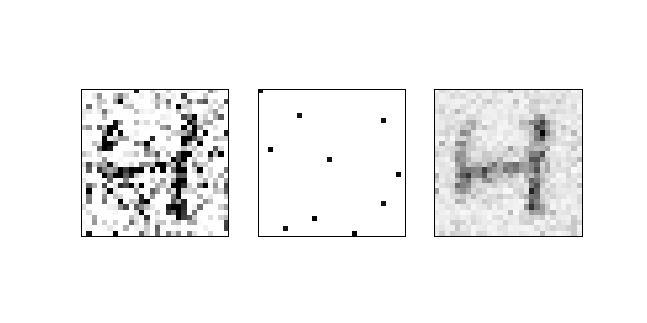

<IPython.core.display.Javascript object>


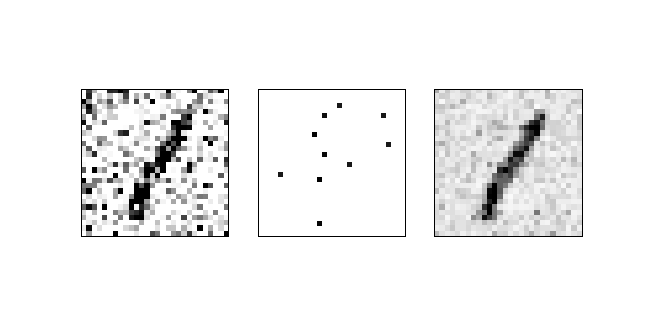

<IPython.core.display.Javascript object>


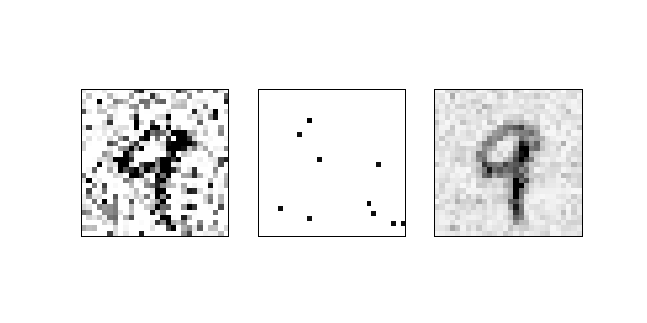

<IPython.core.display.Javascript object>


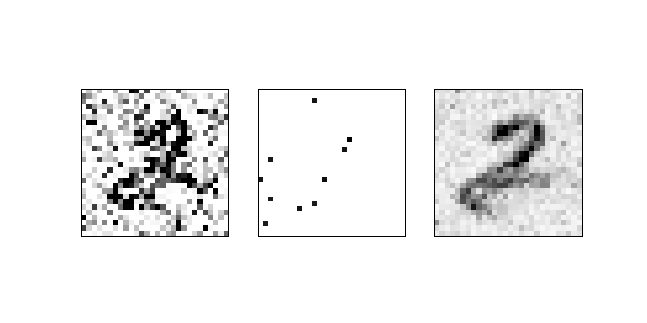

<IPython.core.display.Javascript object>


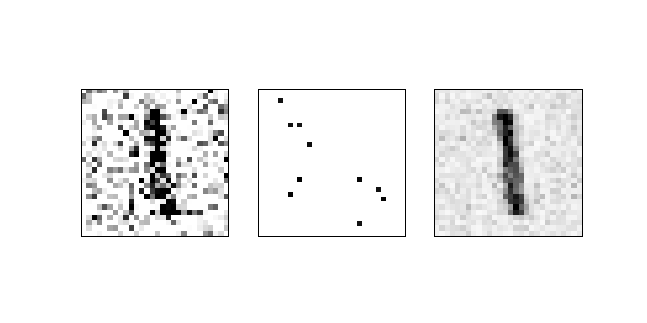

<IPython.core.display.Javascript object>


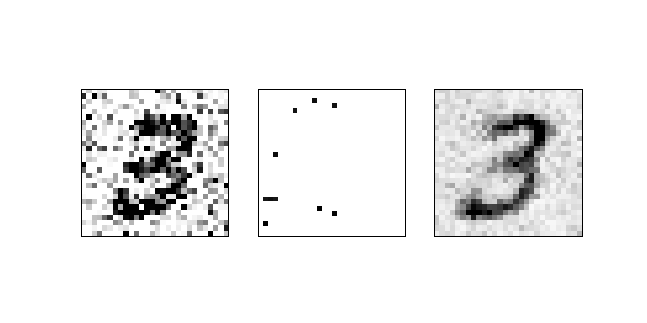

<IPython.core.display.Javascript object>


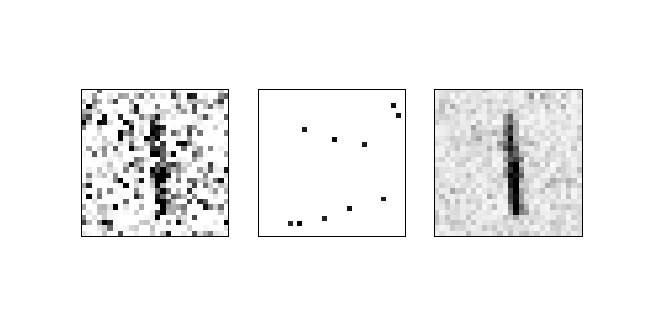

<IPython.core.display.Javascript object>


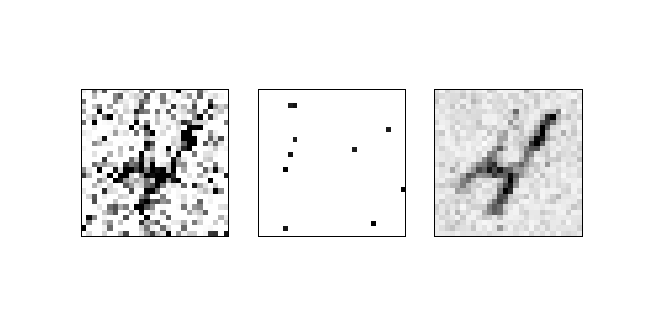

In [76]:
offset = 0

for i in range(10):
    reconstruct(i, w, Kx, Ky, gp_noise5)

I mean hey!  It's not too bad!  

Ok, I'm going to mess with a new signature for noise.

In [81]:
m_noise0 = np.clip(m_flat_tr + np.random.normal(-1, 0.5, m_flat_tr.shape), 0, 1)
gp_noise0 = cp.asarray(m_noise0)

<IPython.core.display.Javascript object>


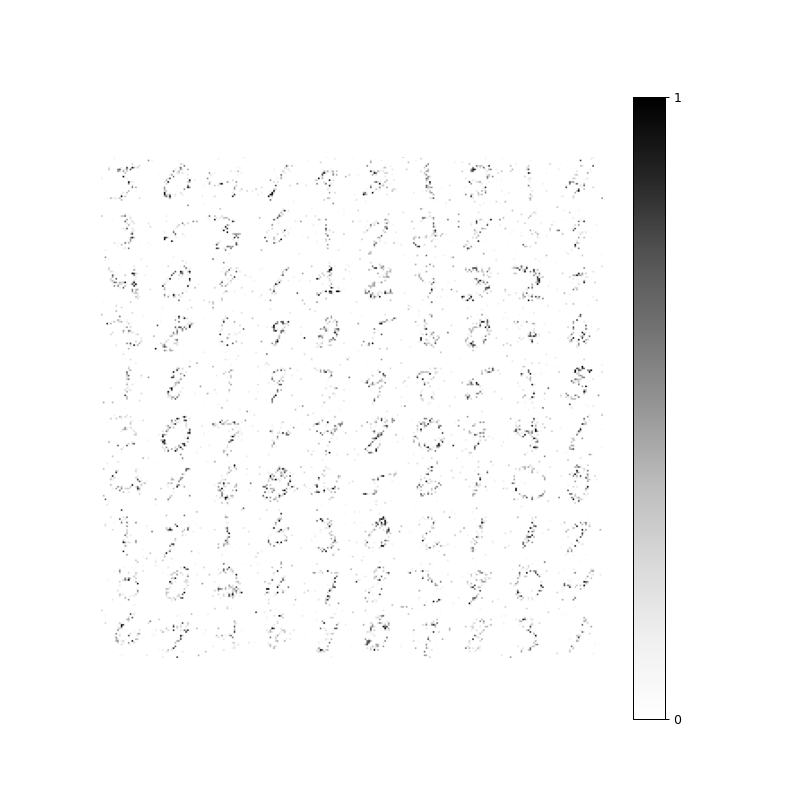

In [82]:
fig = plt.figure(figsize=(10, 10))

draw_weights(gp_noise0.get(), 10, 10, 28, fig)

Oh man.  Now that's interesting.  Let's see what my boi does.  This will need to do a lot of filling in of information.

400 neurons, 10 winners.

<IPython.core.display.Javascript object>


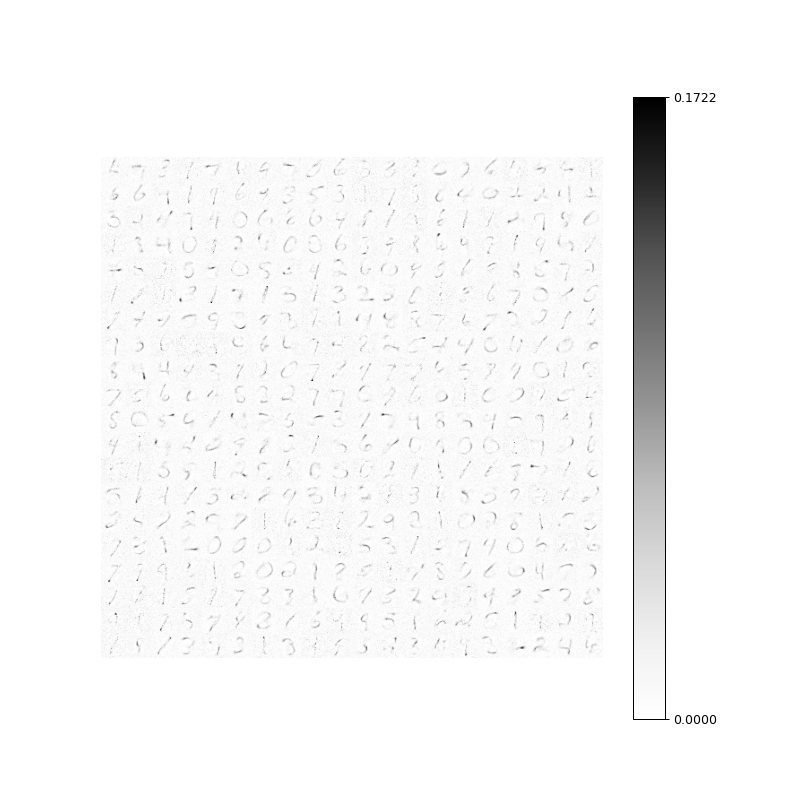

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12000/12000 [00:09<00:00, 1278.78it/s]


In [83]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 5
T_s = 12000

Kx = 20
Ky = 20
m_len = 28 * 28 
tr_len = 60000

prec = 1e-10

n_w = 10 #Number of winners

N = Kx * Ky

# Feedforward
w = cp.random.uniform(0, 0.2, (N, m_len))
xi = 0.01

for ep in range(Nep):
    inputs = gp_noise5[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        p = w @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((N, 1))
        mask[winners] = 1
        o = mask * p
        r = w.T @ o
        mod_r = cp.maximum(r, prec)
        e = v - r

        w += w * o * (e / mod_r).T * xi

    draw_weights(w.get(), Kx, Ky, 28, fig)

<IPython.core.display.Javascript object>


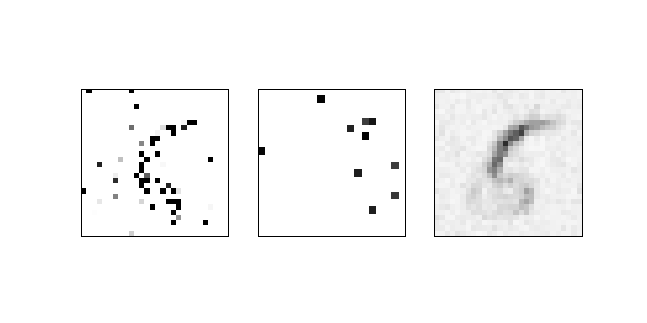

<IPython.core.display.Javascript object>


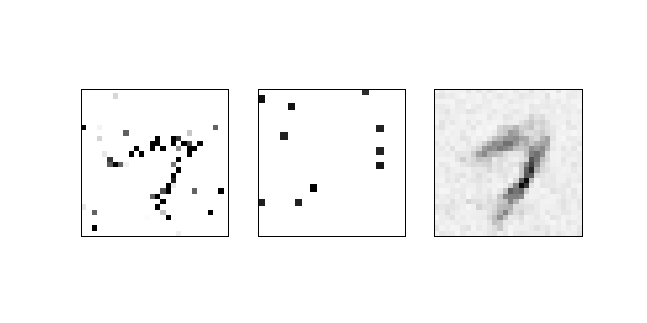

<IPython.core.display.Javascript object>


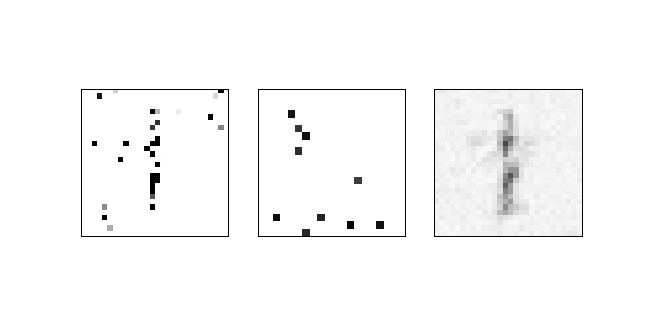

<IPython.core.display.Javascript object>


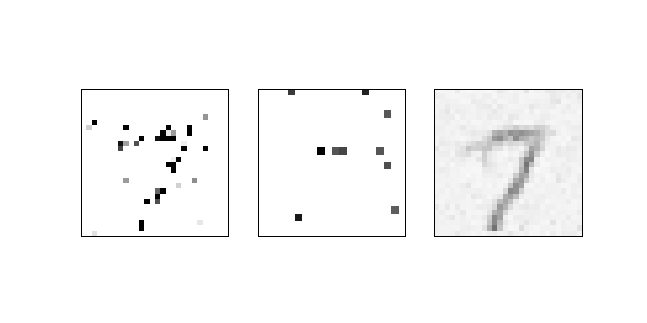

<IPython.core.display.Javascript object>


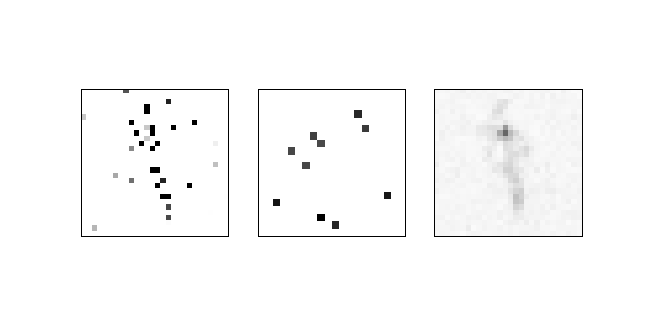

<IPython.core.display.Javascript object>


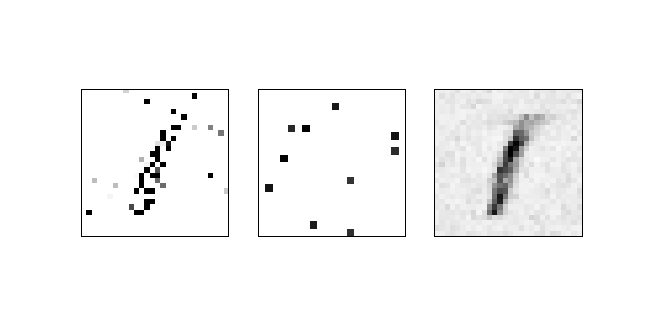

<IPython.core.display.Javascript object>


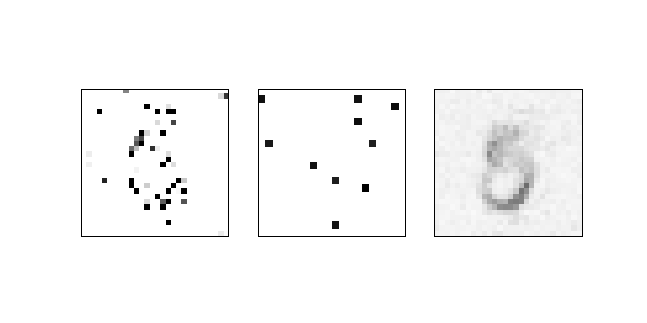

<IPython.core.display.Javascript object>


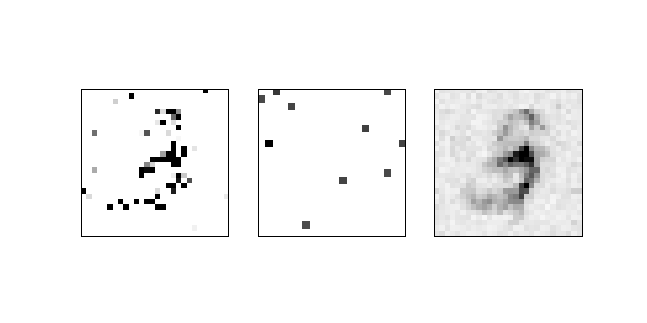

<IPython.core.display.Javascript object>


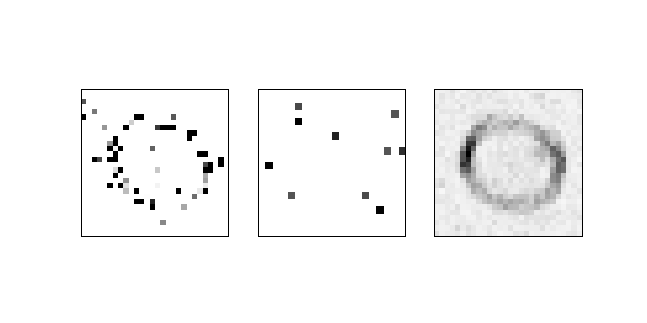

<IPython.core.display.Javascript object>


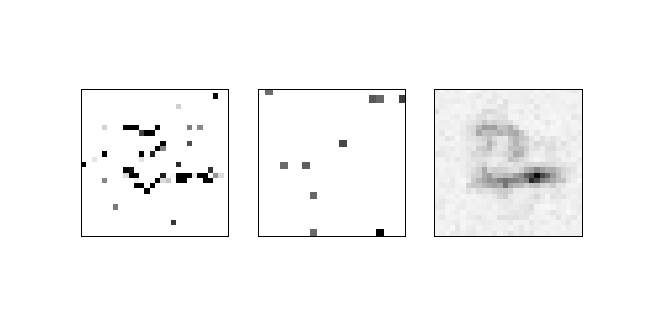

In [89]:
offset = 100

for i in range(10):
    reconstruct(i + offset, w, Kx, Ky, gp_noise0, 0.2, 0)

Man, that's pretty interesting.  I'm going to train this on 900 neurons.

<IPython.core.display.Javascript object>


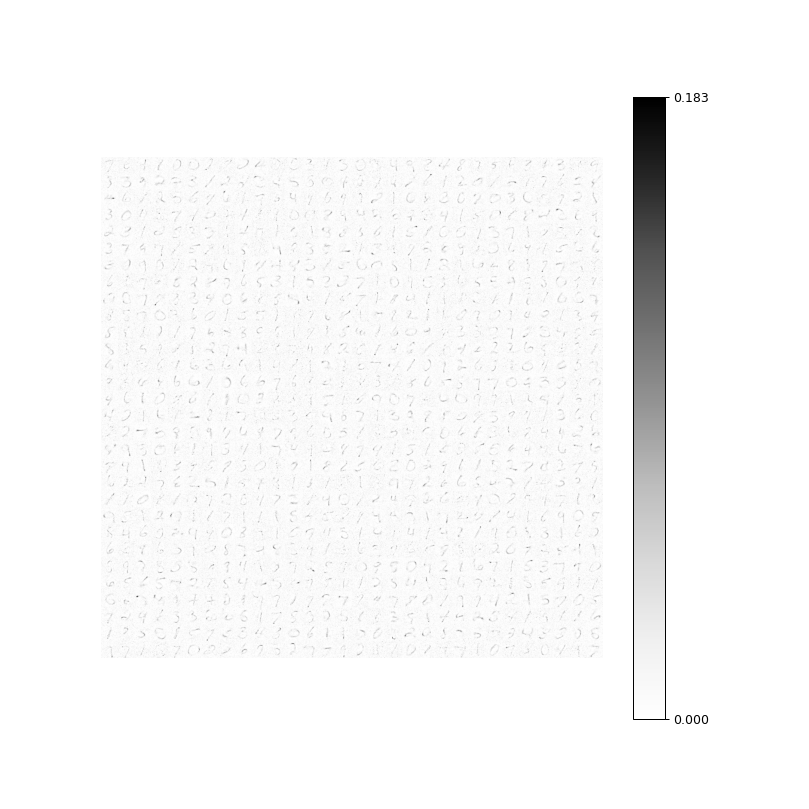

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12000/12000 [00:20<00:00, 586.33it/s]


In [90]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 5
T_s = 12000

Kx = 30
Ky = 30
m_len = 28 * 28 
tr_len = 60000

prec = 1e-10

n_w = 10 #Number of winners

N = Kx * Ky

# Feedforward
w = cp.random.uniform(0, 0.2, (N, m_len))
xi = 0.02

for ep in range(Nep):
    inputs = gp_noise5[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        p = w @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((N, 1))
        mask[winners] = 1
        o = mask * p
        r = w.T @ o
        mod_r = cp.maximum(r, prec)
        e = v - r

        w += w * o * (e / mod_r).T * xi

    draw_weights(w.get(), Kx, Ky, 28, fig)

<IPython.core.display.Javascript object>


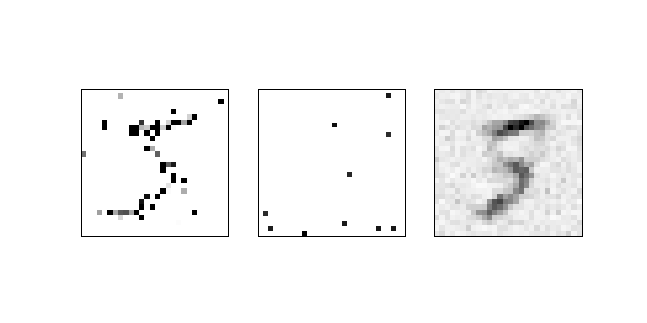

<IPython.core.display.Javascript object>


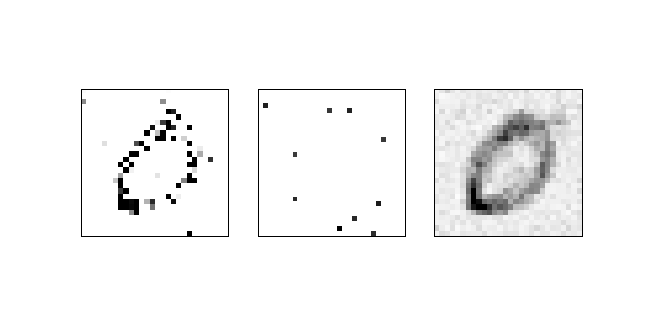

<IPython.core.display.Javascript object>


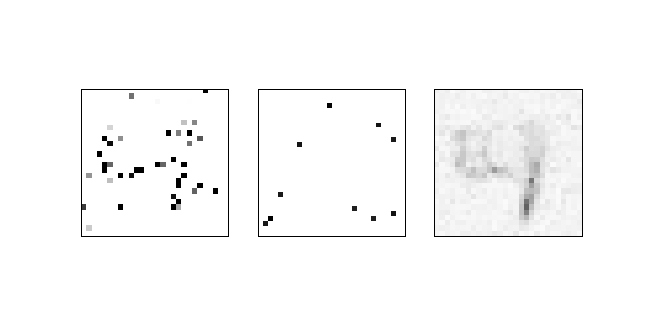

<IPython.core.display.Javascript object>


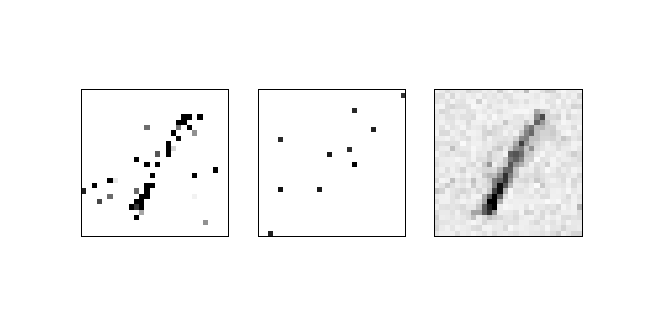

<IPython.core.display.Javascript object>


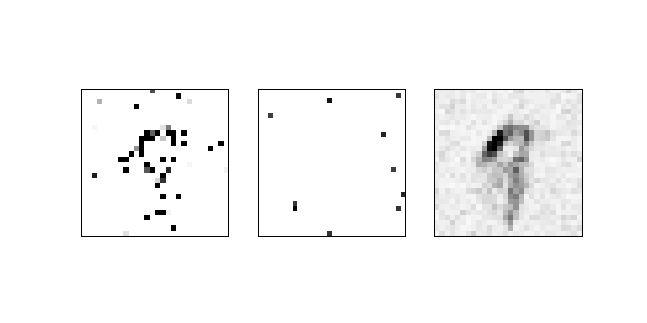

<IPython.core.display.Javascript object>


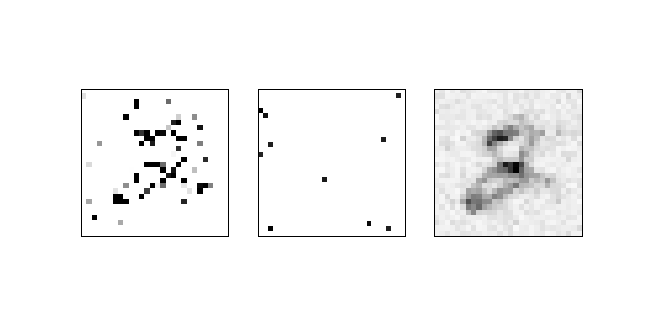

<IPython.core.display.Javascript object>


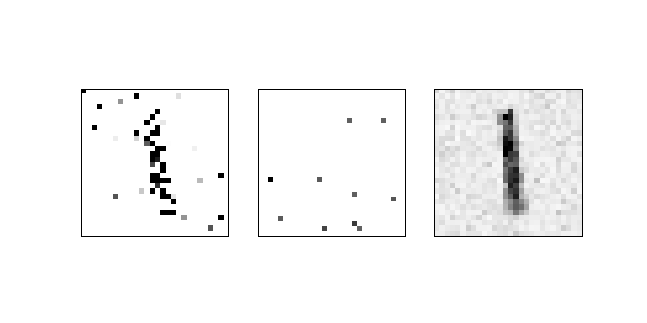

<IPython.core.display.Javascript object>


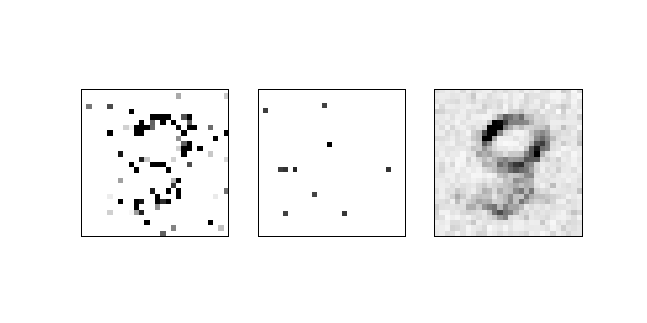

<IPython.core.display.Javascript object>


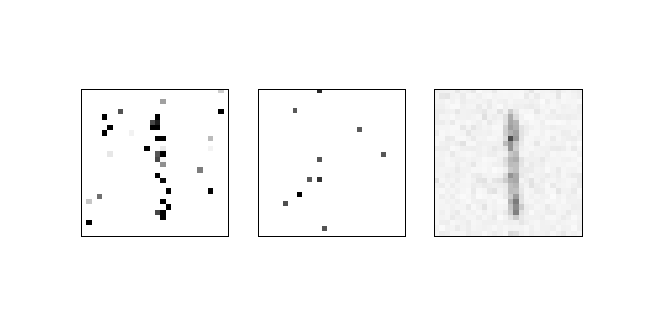

<IPython.core.display.Javascript object>


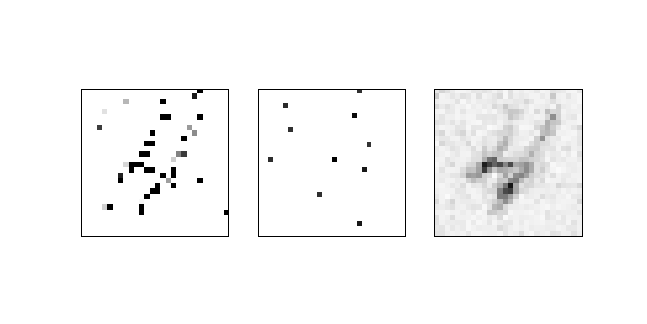

In [92]:
offset = 0

for i in range(10):
    reconstruct(i + offset, w, Kx, Ky, gp_noise0, 0.2, 0)

In [95]:
m_noise10 = np.clip(m_flat_tr + np.random.normal(-0.5, 0.5, m_flat_tr.shape), 0, 1)
gp_noise10 = cp.asarray(m_noise10)

<IPython.core.display.Javascript object>


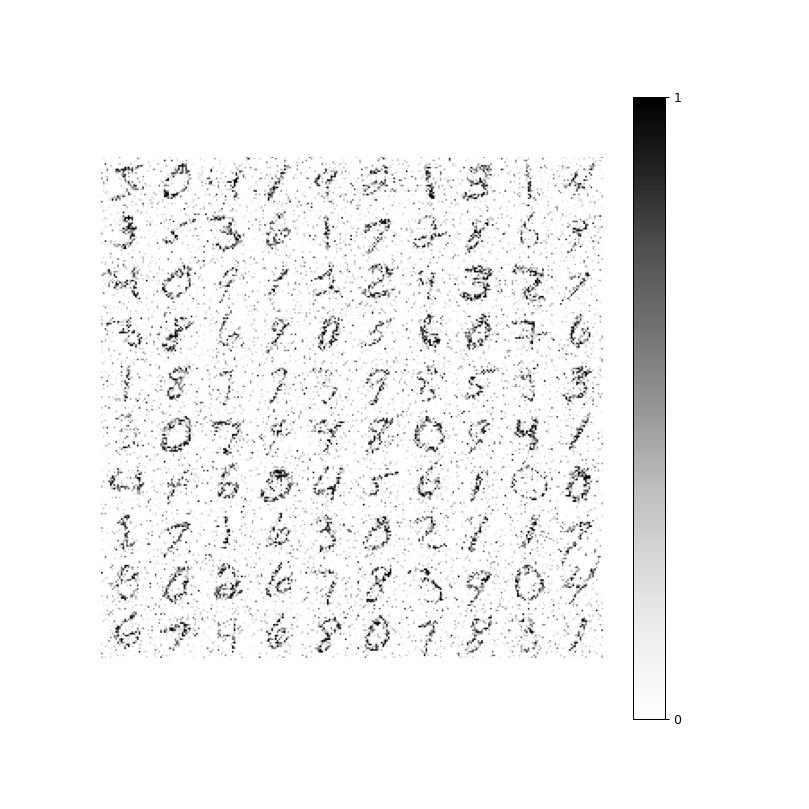

In [96]:
fig = plt.figure(figsize=(10, 10))

draw_weights(gp_noise10.get(), 10, 10, 28, fig)

Ok, this is the final noise profile.  Then I'm moving on.  This is kinda what I pictured when I thought I'd add noise.  I'm just going to go ahead and do 1225 neurons for a bajillion mini-epochs.

<IPython.core.display.Javascript object>


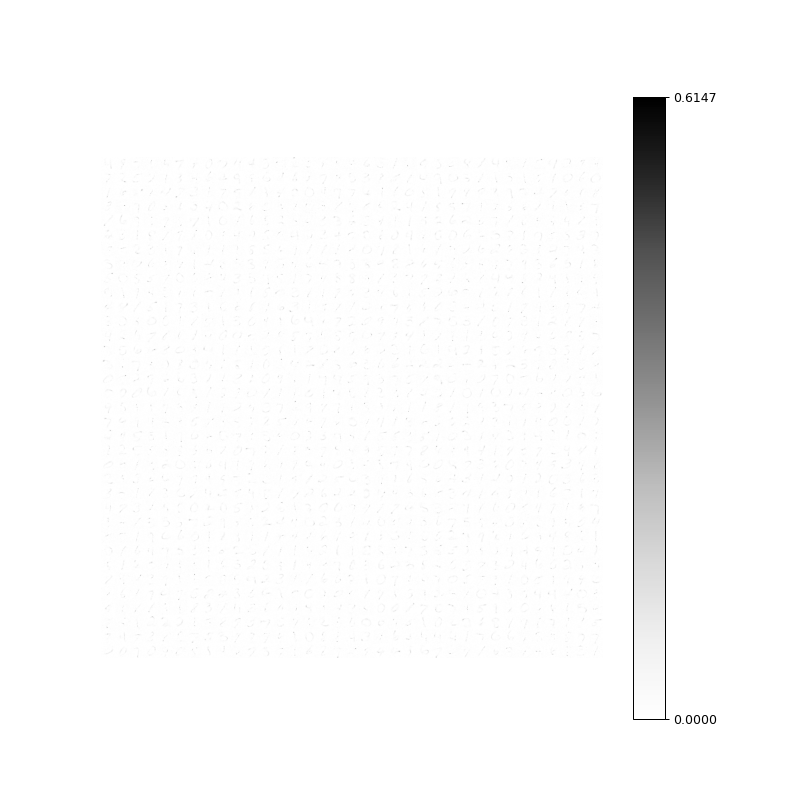

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12000/12000 [00:18<00:00, 647.13it/s]


In [117]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 10
T_s = 12000

Kx = 35
Ky = 35
m_len = 28 * 28 
tr_len = 60000

prec = 1e-10

n_w = 10 #Number of winners

N = Kx * Ky

# Feedforward
w = cp.random.uniform(0, 0.2, (N, m_len))
xi = 0.03

for ep in range(Nep):
    inputs = gp_noise10[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        p = w @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((N, 1))
        mask[winners] = 1
        o = mask * p
        r = w.T @ o
        mod_r = cp.maximum(r, prec)
        e = v - r

        w += w * o * (e / mod_r).T * xi

    draw_weights(w.get(), Kx, Ky, 28, fig)

<IPython.core.display.Javascript object>


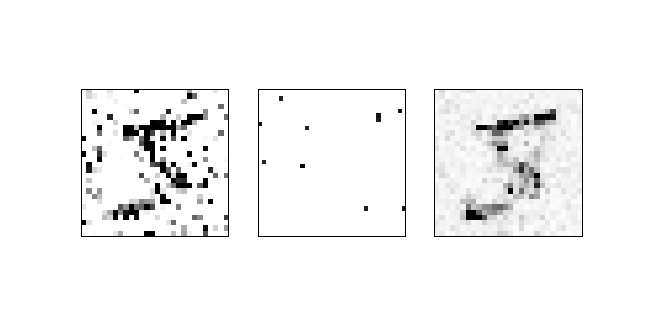

<IPython.core.display.Javascript object>


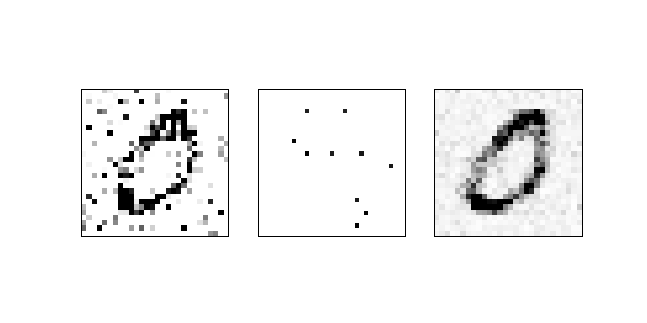

<IPython.core.display.Javascript object>


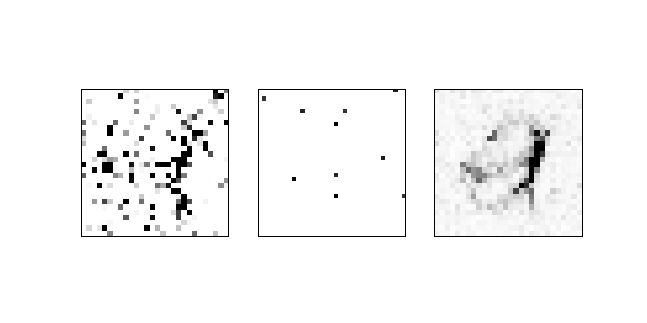

<IPython.core.display.Javascript object>


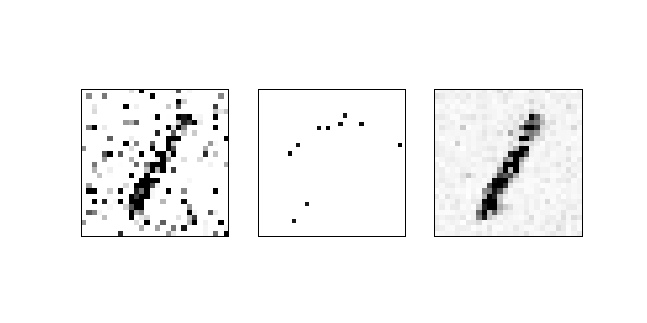

<IPython.core.display.Javascript object>


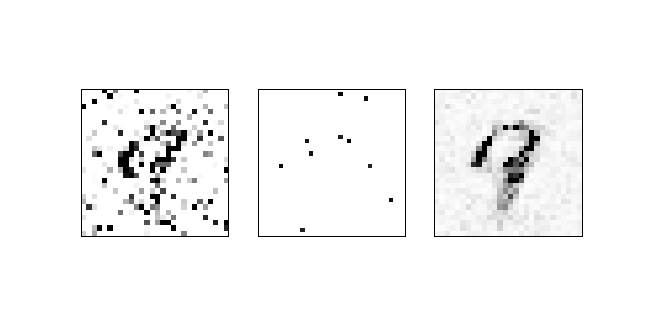

<IPython.core.display.Javascript object>


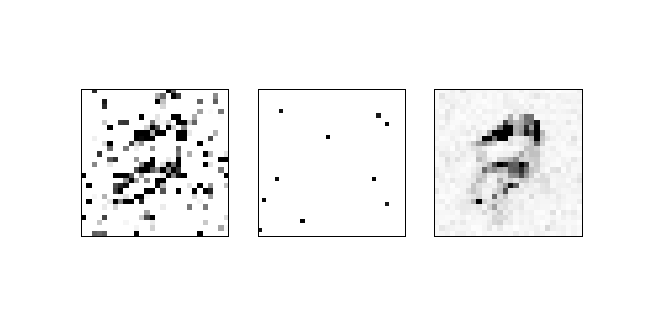

<IPython.core.display.Javascript object>


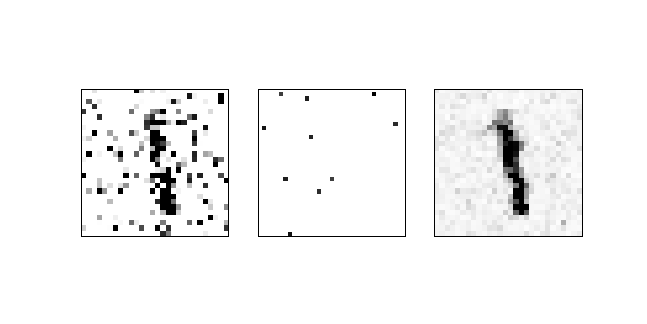

<IPython.core.display.Javascript object>


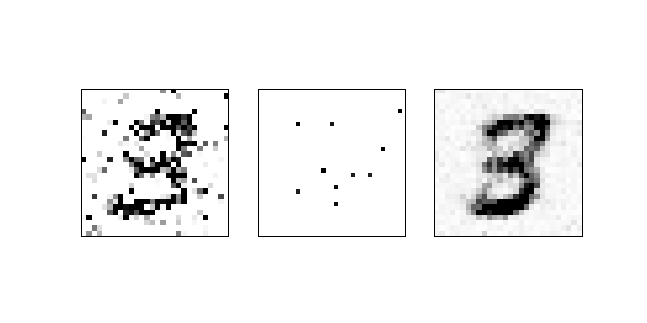

<IPython.core.display.Javascript object>


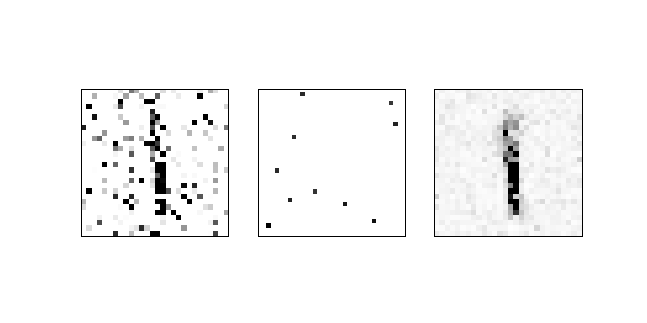

<IPython.core.display.Javascript object>


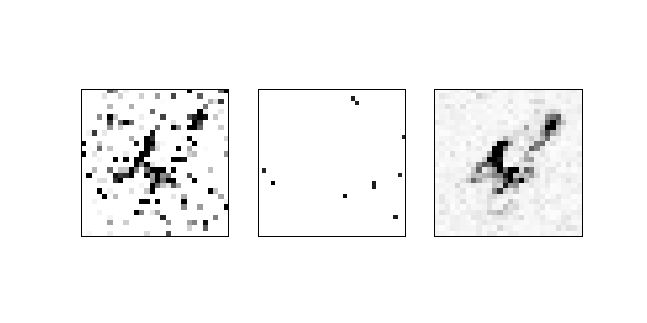

In [118]:
offset = 0

for i in range(10):
    reconstruct(i + offset, w, Kx, Ky, gp_noise10, 0.5, 0)

<IPython.core.display.Javascript object>


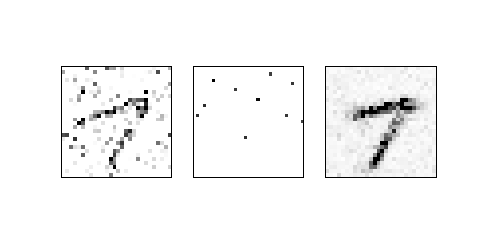

In [119]:
s_len = 28

vmax=0.5
vmin=0

img = gp_noise10[101]

v = img.reshape(-1, 1)
p = w @ v
winners = cp.argsort(p, axis=0)[-n_w:]
mask = cp.zeros((N, 1))
mask[winners] = 1
o = mask * p
r = w.T @ o

plt.figure(figsize=(6, 3))

plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(img.reshape(s_len, s_len).get(), cmap="Greys", vmax=1, vmin=vmin)

plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(o.reshape(Ky, Kx).get(), cmap="Greys")

plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(r.reshape(s_len, s_len).get(), cmap="Greys", vmax=vmax, vmin=vmin)

plt.show()

Well, this is dope.  Basically all my dreams came true.  Well, that's not quite accurate.  I'm still not a huge fan of the background noise.  But whatever.  This bad boi is finding and isolating stable structure.  What could possibly be better?

## Conclusions

My network is dope, and everything is dope.  I mean, it's actually pretty easy to understand what's going on, so it's not super crazy that this works, but still, it's good to see that I'm not wrong.  Not being wrong is the absolute sauce.  

So, anyway, as I just wrote, this network is able to find stable structure in noisy data.  This is in contrast to the stupid things I've been seeing with auto-encoders, in which you put a noisy image into the auto-encoder, and train it on the clean image.  

Hey fam?  In the real world, we don't just get clean data.  We need to be able to look at noise, and find the structure.  So anyway, this is super awesome.  So the sparse layer effectively finds the structure in the data given a potentially noisy input. Dope dope dope.

## Next steps

Well in terms of algorithms, **it's frikin time to do the invariant layer, OK??** So yeah, that should hopefully be the next non-hardware related experiment.  

On a different note, I've been cleared to get a p3.2xLarge aws instance, which is absolutely decked out with a huge GPU and 8 vCPUs, and my issues with the stupid quota and ssh have cleared up, so I think I'm just going to transfer this whole operation on over to AWS.  That's super dope because I can run all of my experiments entirely externally, and I don't have to worry about these experiments jacking my own computer.  So yeah.  Spinning up that instance is what I'm doing next.

Edit: I'm briefly going to re-open this experiment, just because there's one more type of corrupted data I want to try.  Basically, I'm only going to subtract from the images.  So no noise, only corruption.  

<IPython.core.display.Javascript object>


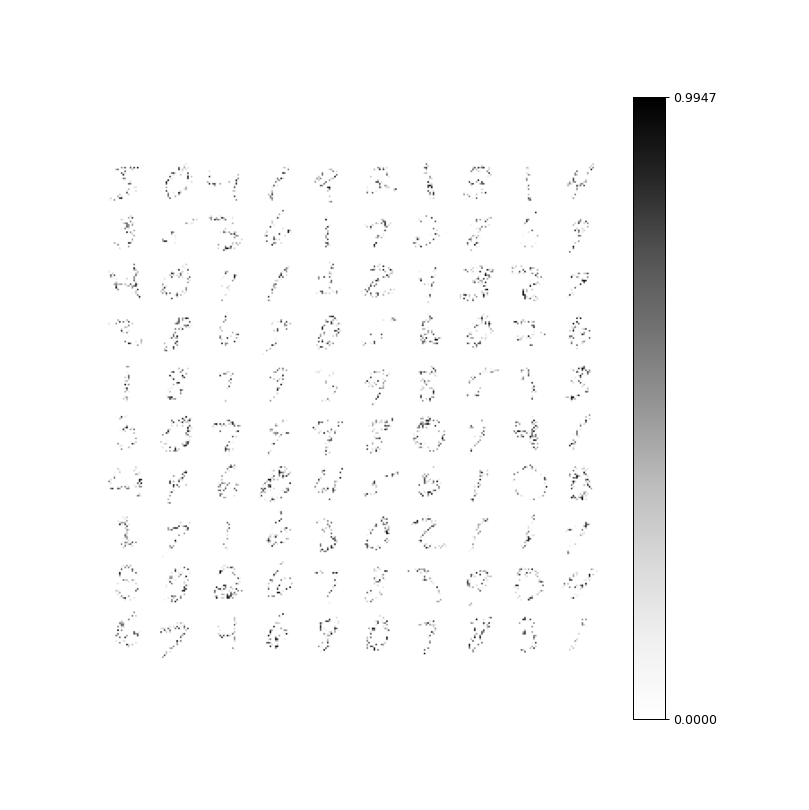

In [120]:
m_noise_neg = np.clip(m_flat_tr - np.abs(np.random.normal(0, 2, m_flat_tr.shape)), 0, 1)
gp_noise_neg = cp.asarray(m_noise_neg)

fig = plt.figure(figsize=(10, 10))

draw_weights(gp_noise_neg.get(), 10, 10, 28, fig)

<IPython.core.display.Javascript object>


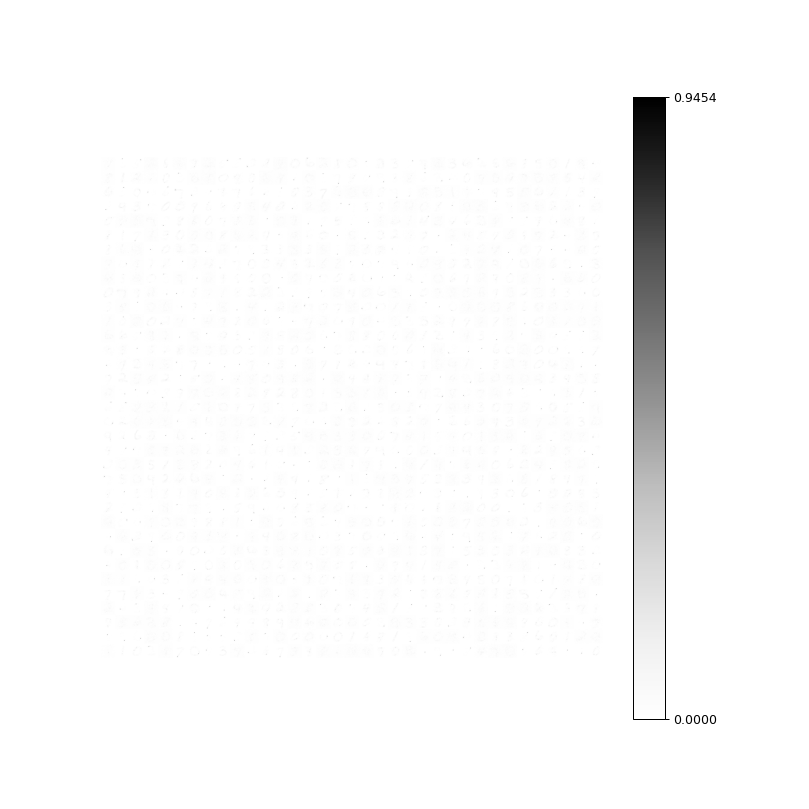

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12000/12000 [00:27<00:00, 586.00it/s]


In [121]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 10
T_s = 12000

Kx = 35
Ky = 35
m_len = 28 * 28 
tr_len = 60000

prec = 1e-10

n_w = 10 #Number of winners

N = Kx * Ky

# Feedforward
w = cp.random.uniform(0, 0.2, (N, m_len))
xi = 0.03

for ep in range(Nep):
    inputs = gp_noise_neg[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        p = w @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((N, 1))
        mask[winners] = 1
        o = mask * p
        r = w.T @ o
        mod_r = cp.maximum(r, prec)
        e = v - r

        w += w * o * (e / mod_r).T * xi

    draw_weights(w.get(), Kx, Ky, 28, fig)

<IPython.core.display.Javascript object>


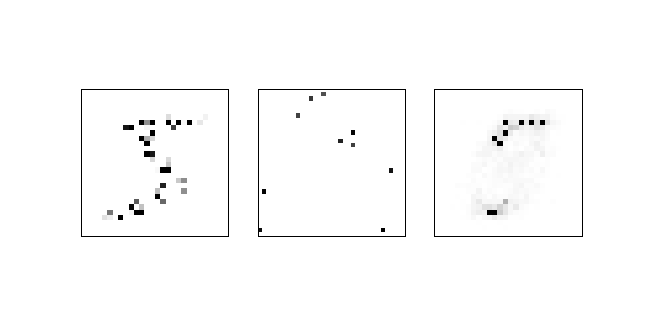

<IPython.core.display.Javascript object>


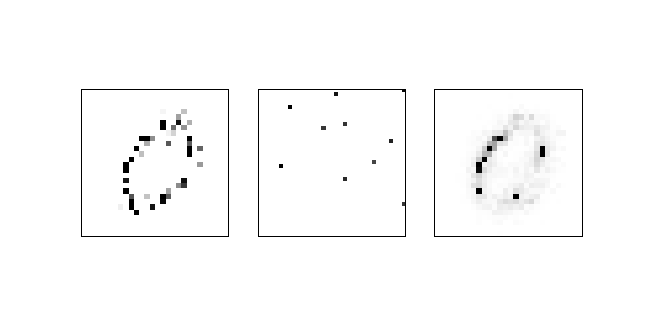

<IPython.core.display.Javascript object>


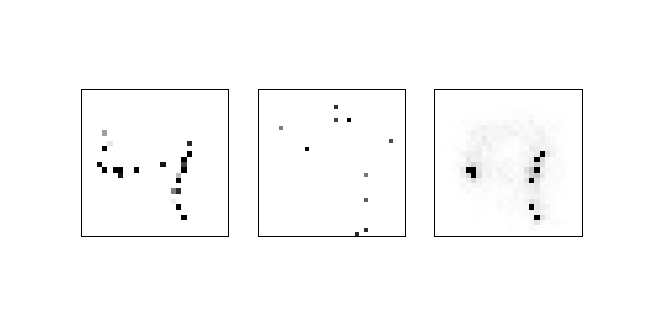

<IPython.core.display.Javascript object>


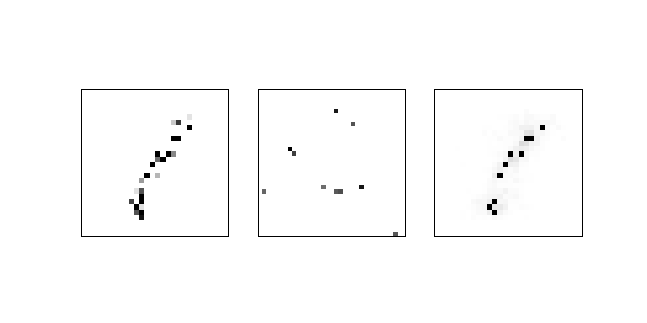

<IPython.core.display.Javascript object>


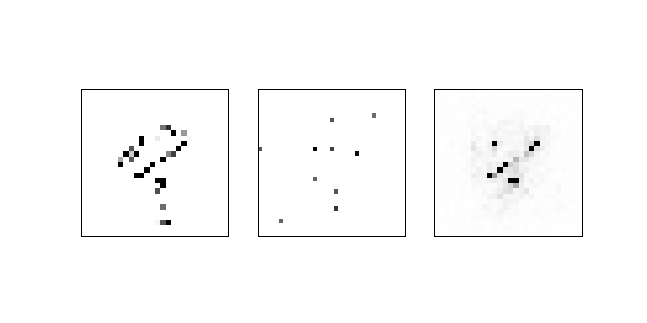

<IPython.core.display.Javascript object>


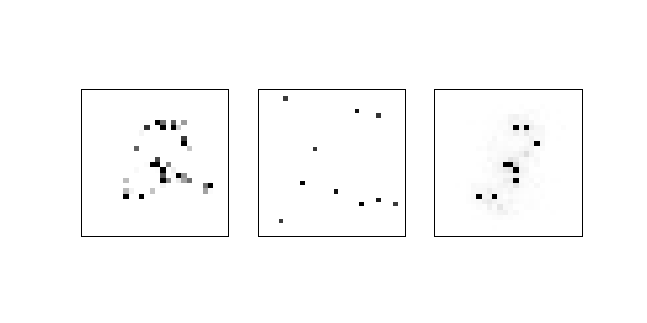

<IPython.core.display.Javascript object>


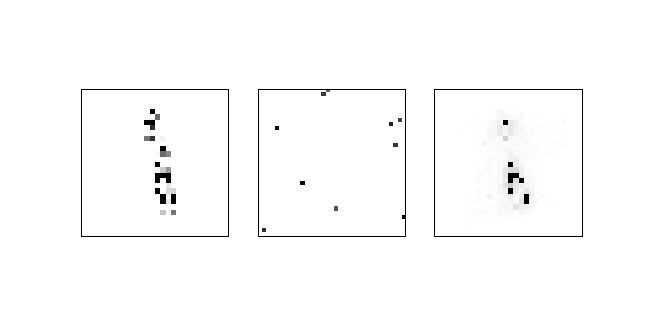

<IPython.core.display.Javascript object>


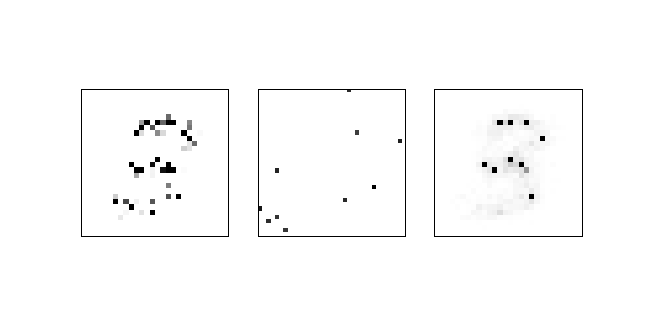

<IPython.core.display.Javascript object>


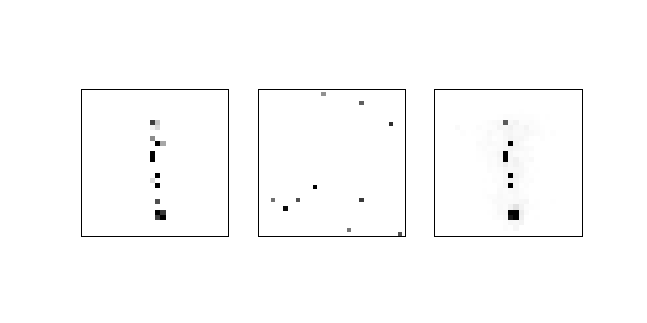

<IPython.core.display.Javascript object>


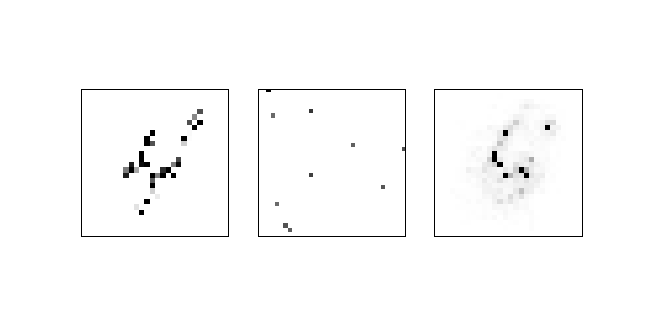

In [122]:
offset = 0

for i in range(10):
    reconstruct(i + offset, w, Kx, Ky, gp_noise_neg, 0.5, 0)

Hmm, this is super interesting.  I think this is a perfect example of when my number of winners is too high for me to actually find the structure, versus simply reconstructing noise.  I'm going to do this again, but take it down to 3 winners.  Also I'm going to do 900 neurons just cause.

<IPython.core.display.Javascript object>


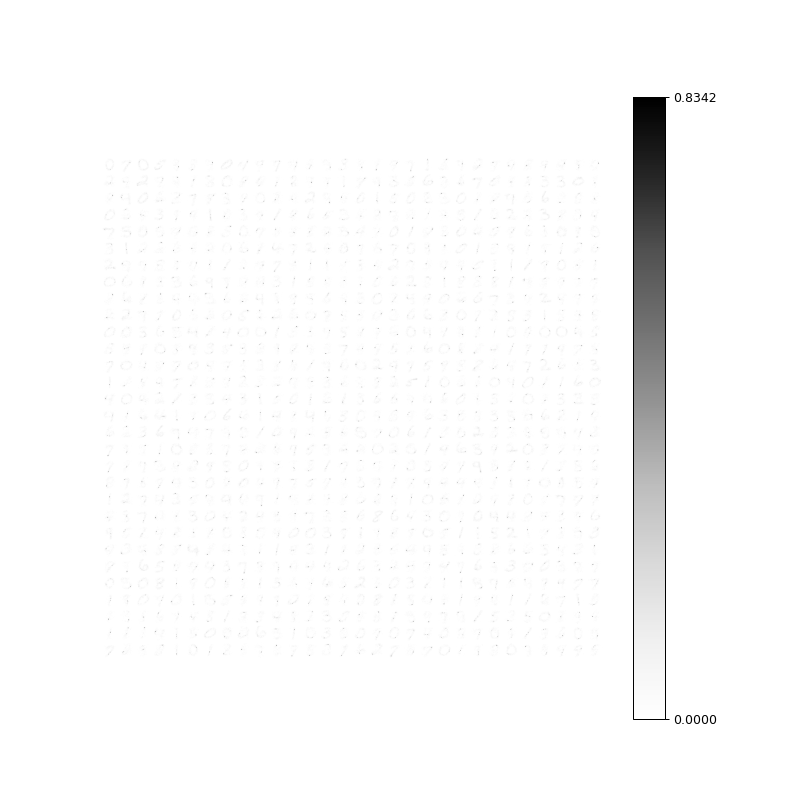

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12000/12000 [00:21<00:00, 552.03it/s]


In [124]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 10
T_s = 12000

Kx = 30
Ky = 30
m_len = 28 * 28 
tr_len = 60000

prec = 1e-10

n_w = 3 #Number of winners

N = Kx * Ky

# Feedforward
w = cp.random.uniform(0, 0.2, (N, m_len))
xi = 0.05

for ep in range(Nep):
    inputs = gp_noise_neg[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        p = w @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((N, 1))
        mask[winners] = 1
        o = mask * p
        r = w.T @ o
        mod_r = cp.maximum(r, prec)
        e = v - r

        w += w * o * (e / mod_r).T * xi

    draw_weights(w.get(), Kx, Ky, 28, fig)

<IPython.core.display.Javascript object>


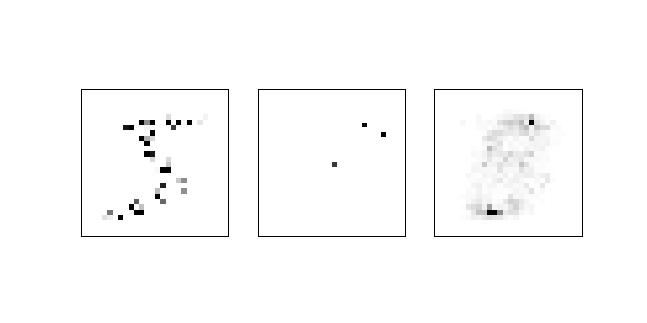

<IPython.core.display.Javascript object>


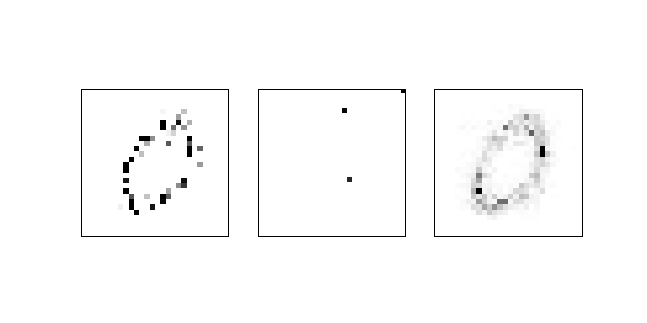

<IPython.core.display.Javascript object>


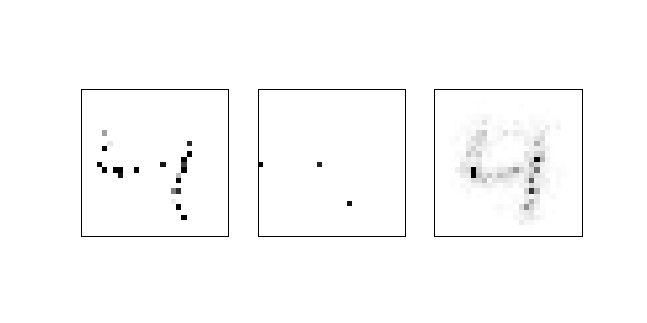

<IPython.core.display.Javascript object>


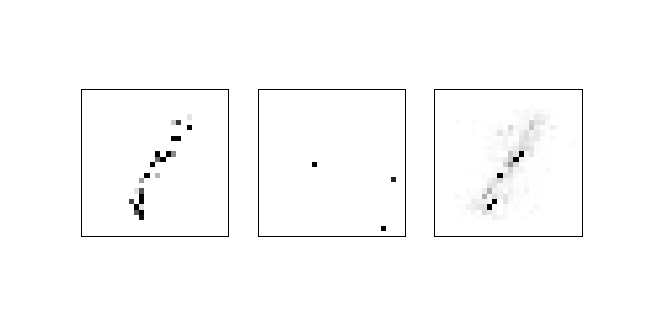

<IPython.core.display.Javascript object>


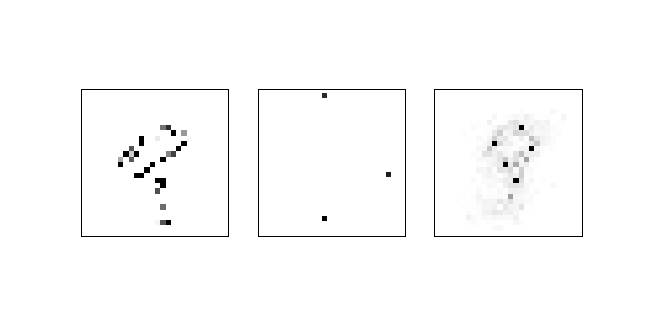

<IPython.core.display.Javascript object>


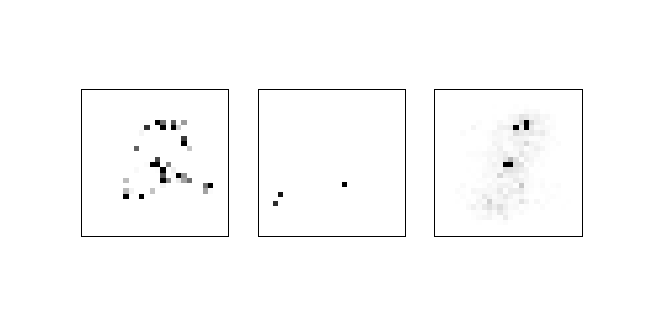

<IPython.core.display.Javascript object>


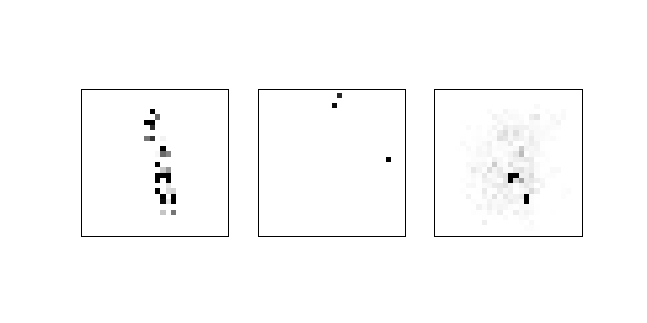

<IPython.core.display.Javascript object>


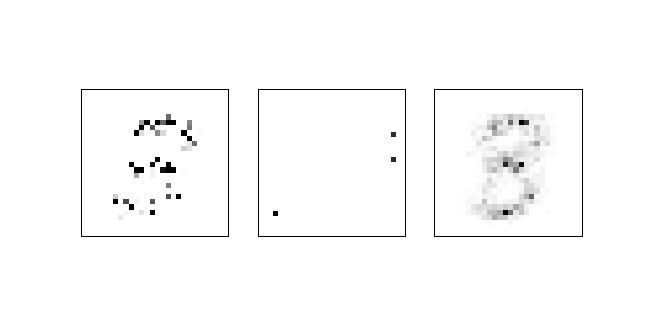

<IPython.core.display.Javascript object>


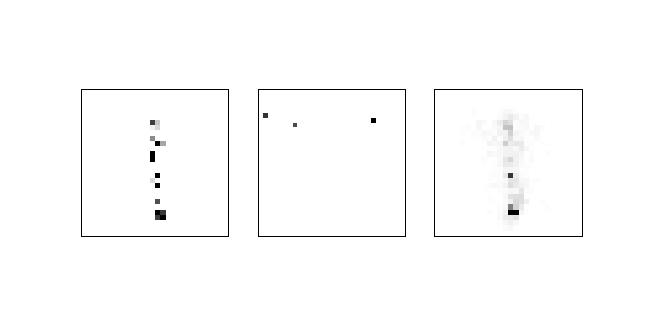

<IPython.core.display.Javascript object>


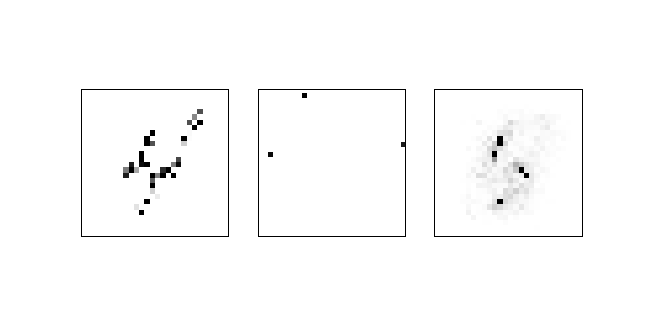

In [125]:
offset = 0

for i in range(10):
    reconstruct(i + offset, w, Kx, Ky, gp_noise_neg, 0.5, 0)

Ok, we're seeing a bit more structure.  Kinda.  Ok, I'm going to try one final thing.  I'm going to do 10 winners, but I'm going to make sure the normalized input is the same.

<IPython.core.display.Javascript object>


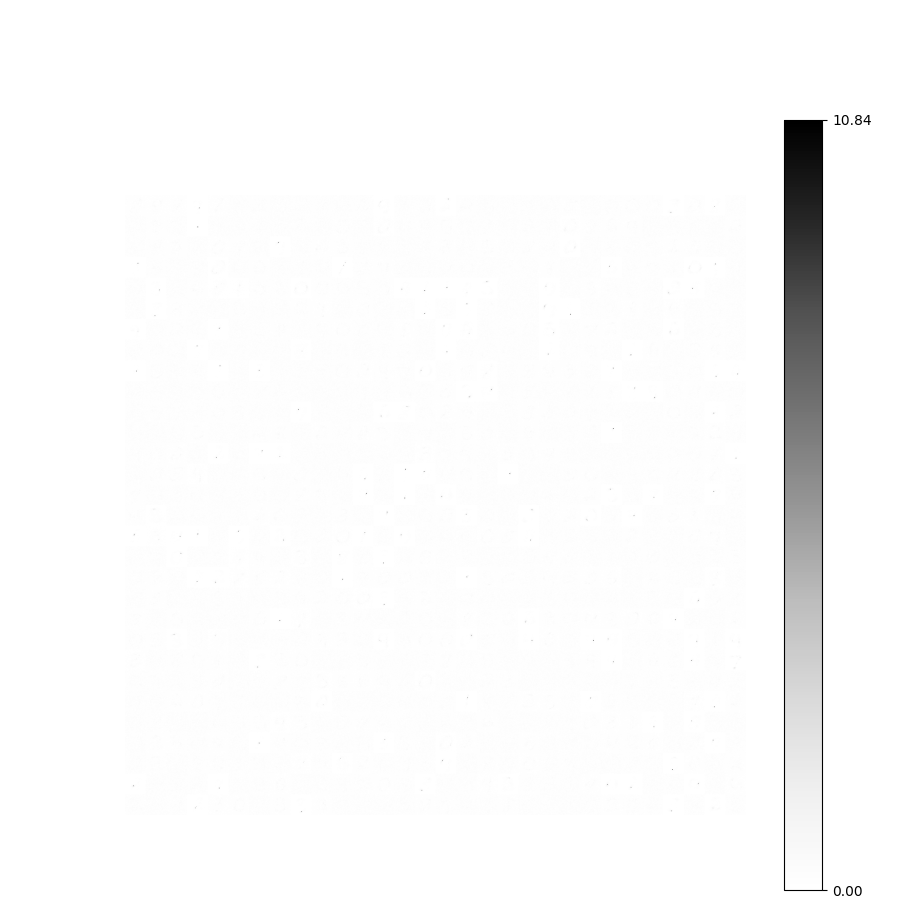

 24%|███████████████████████████████████████▎                                                                                                                              | 2845/12000 [00:06<00:32, 285.86it/s]


KeyboardInterrupt: 

In [127]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 10
T_s = 12000

Kx = 30
Ky = 30
m_len = 28 * 28 
tr_len = 60000

prec = 1e-10

n_w = 10 #Number of winners

N = Kx * Ky

# Feedforward
w = cp.random.uniform(0, 0.3, (N, m_len))
xi = 0.03

for ep in range(Nep):
    inputs = gp_noise_neg[np.random.permutation(tr_len)]
    for i in tqdm(range(T_s)):
        v = inputs[i].reshape(-1, 1)
        p = w @ v
        
        nrm = np.sum(w, axis=1).reshape(-1, 1)
        
        la = p / nrm

        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((N, 1))
        mask[winners] = 1
        
        la_mean = np.mean(mask * la)
        
        o = mask * nrm * la_mean
        r = w.T @ o
        mod_r = cp.maximum(r, prec)
        e = v - r

        w += w * o * (e / mod_r).T * xi

    draw_weights(w.get(), Kx, Ky, 28, fig)

<IPython.core.display.Javascript object>


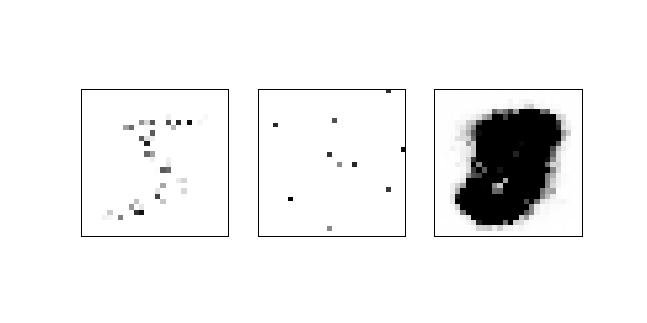

<IPython.core.display.Javascript object>


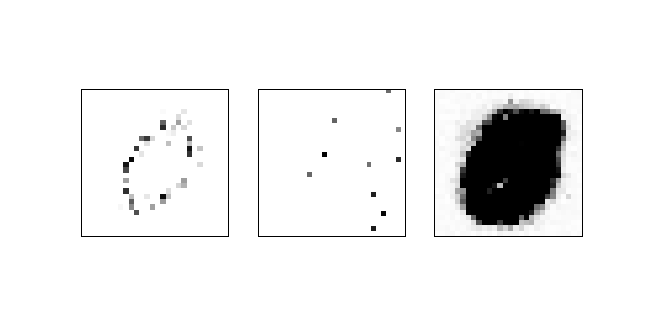

<IPython.core.display.Javascript object>


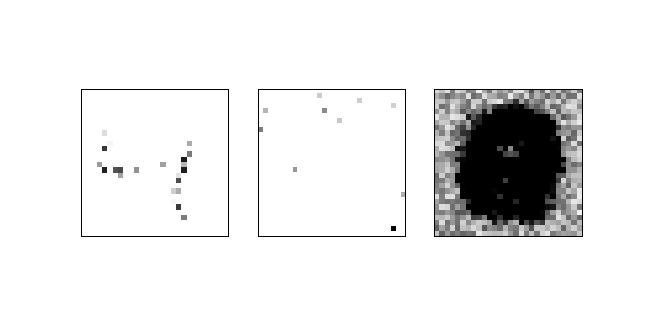

<IPython.core.display.Javascript object>


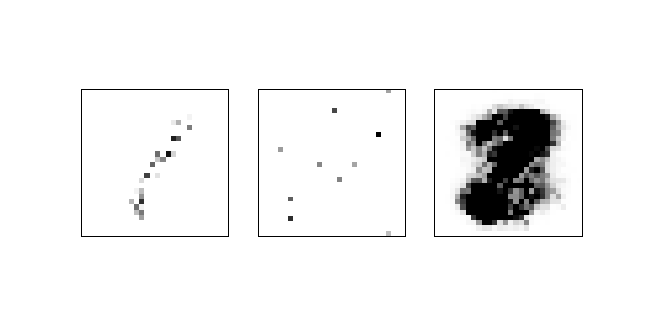

<IPython.core.display.Javascript object>


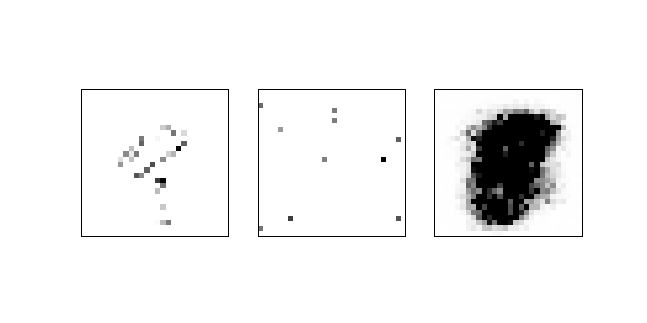

<IPython.core.display.Javascript object>


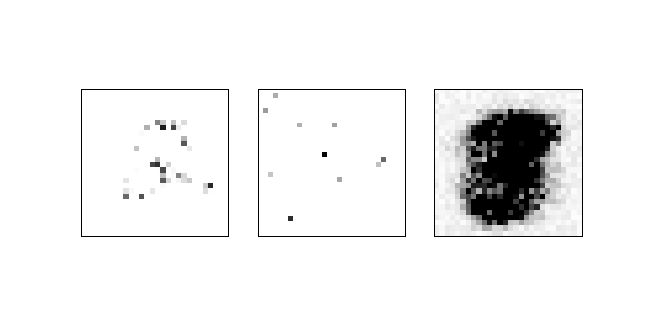

<IPython.core.display.Javascript object>


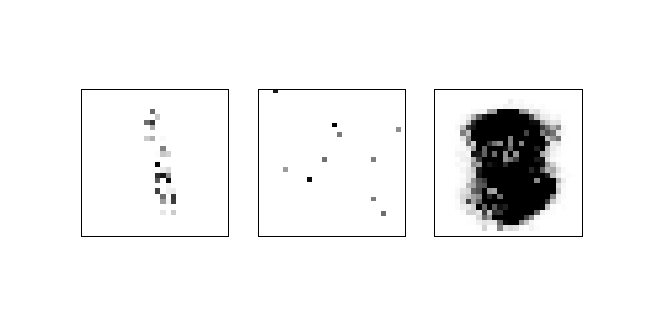

<IPython.core.display.Javascript object>


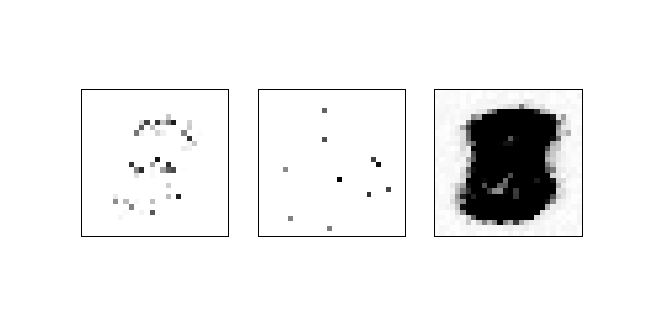

<IPython.core.display.Javascript object>


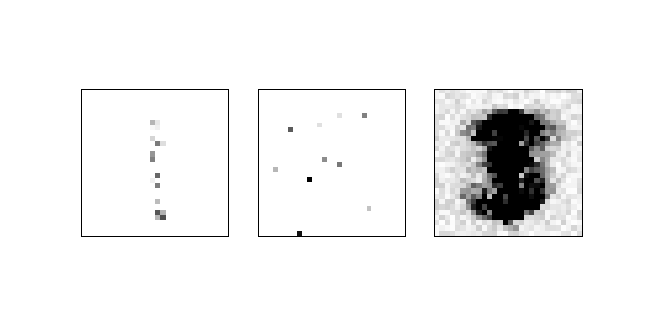

<IPython.core.display.Javascript object>


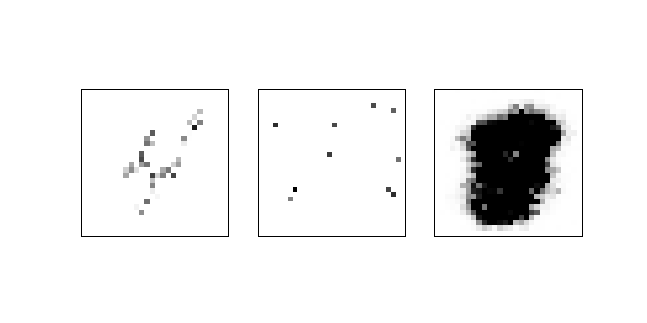

In [129]:
offset = 0

for i in range(10):
    reconstruct(i + offset, w, Kx, Ky, gp_noise_neg, 1, 0)

Oh boy.  That's no good.  K, this experiment's over.